In [ ]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("seaborn-v0_8-colorblind")

import math

import tensorflow as tf
from tensorflow.keras import (
    layers,
    models,
    optimizers,
    utils,
    callbacks,
    metrics,
    losses,
    activations,
)

In [ ]:
IMAGE_SIZE = 64
BATCH_SIZE = 64
DATASET_REPETITIONS = 5
LOAD_MODEL = False

NOISE_EMBEDDING_SIZE = 32
PLOT_DIFFUSION_STEPS = 20

# optimization
EMA = 0.999
LEARNING_RATE = 1e-3
WEIGHT_DECAY = 1e-4
EPOCHS = 50

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"jayshah1234","key":"b5a70f58d9814ed536fb83b549b26d2c"}'}

In [ ]:
# Move the uploaded kaggle.json file to the correct location
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d nunenuh/pytorch-challange-flower-dataset

 95% 313M/330M [00:05<00:00, 58.8MB/s]
100% 330M/330M [00:05<00:00, 62.0MB/s]


In [ ]:
# Now you can use the Kaggle API to download the dataset
kaggle_username = "nunenuh"
dataset_name = " pytorch-challange-flower-dataset"

# Create the Kaggle dataset URL
dataset_url = f"{kaggle_username}/{dataset_name}"

# Unzip the downloaded dataset
!unzip -q {dataset_name}.zip -d {dataset_name}

In [ ]:
# Load the data
train_data = utils.image_dataset_from_directory(
    "/content/pytorch-challange-flower-dataset/dataset",
    labels=None,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=None,
    shuffle=True,
    seed=42,
    interpolation="bilinear",
)

Found 8189 files belonging to 1 classes.


In [ ]:
# Preprocess the data
def preprocess(img):
    img = tf.cast(img, "float32") / 255.0
    return img


train = train_data.map(lambda x: preprocess(x))
train = train.repeat(DATASET_REPETITIONS)
train = train.batch(BATCH_SIZE, drop_remainder=True)

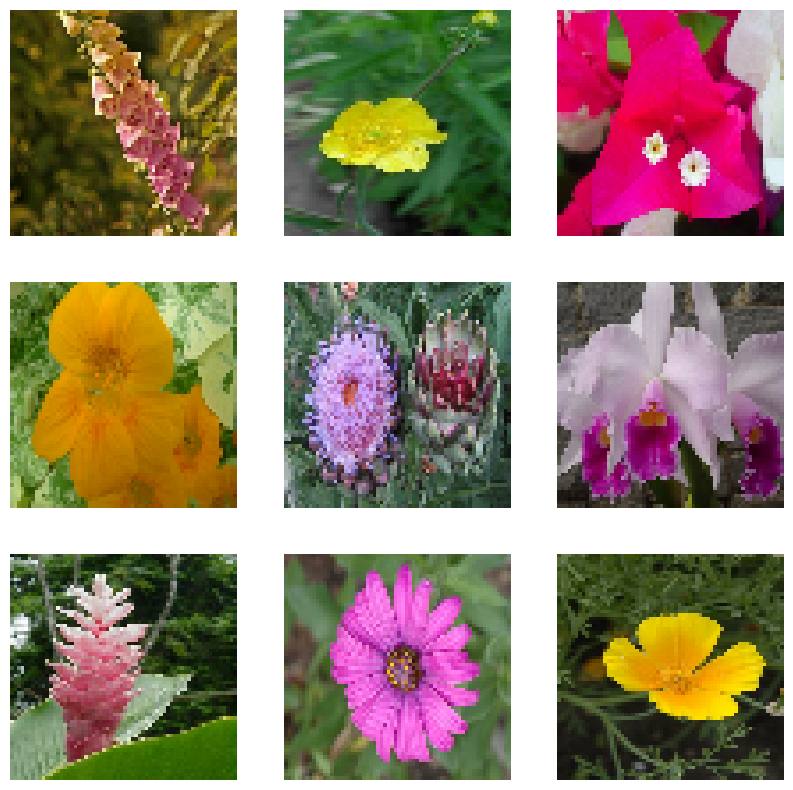

In [ ]:
# Get a batch of images from the training dataset
for images in train.take(1):
    # Plot the first 9 images
    plt.figure(figsize=(10, 10))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        plt.axis("off")
    plt.show()

In [ ]:
def linear_diffusion_schedule(diffusion_times):
    min_rate = 0.0001
    max_rate = 0.02
    betas = min_rate + diffusion_times * (max_rate - min_rate)
    alphas = 1 - betas
    alpha_bars = tf.math.cumprod(alphas)
    signal_rates = tf.sqrt(alpha_bars)
    noise_rates = tf.sqrt(1 - alpha_bars)
    return noise_rates, signal_rates

This equation is a simplified version of the actual cosine diffusion schedule used in
the paper. The authors also add an offset term and scaling to prevent the noising steps
from being too small at the beginning of the diffusion process

In [ ]:
def cosine_diffusion_schedule(diffusion_times):
    signal_rates = tf.cos(diffusion_times * math.pi / 2)
    noise_rates = tf.sin(diffusion_times * math.pi / 2)
    return noise_rates, signal_rates

The offset cosine diffusion schedule that we will be using, which adjusts the
schedule to ensure the noising steps are not too small at the start of the noising
process.


In [ ]:
def offset_cosine_diffusion_schedule(diffusion_times):
    min_signal_rate = 0.02
    max_signal_rate = 0.95
    start_angle = tf.acos(max_signal_rate)
    end_angle = tf.acos(min_signal_rate)

    diffusion_angles = start_angle + diffusion_times * (end_angle - start_angle)

    signal_rates = tf.cos(diffusion_angles)
    noise_rates = tf.sin(diffusion_angles)

    return noise_rates, signal_rates

Notice how the noise level ramps up more slowly in the cosine diffusion schedule. A
cosine diffusion schedule adds noise to the image more gradually than a linear diffusion schedule, which improves training efficiency and generation quality.

In [ ]:
T = 1000
diffusion_times = tf.convert_to_tensor([x / T for x in range(T)])
linear_noise_rates, linear_signal_rates = linear_diffusion_schedule(
    diffusion_times
)
cosine_noise_rates, cosine_signal_rates = cosine_diffusion_schedule(
    diffusion_times
)
(
    offset_cosine_noise_rates,
    offset_cosine_signal_rates,
) = offset_cosine_diffusion_schedule(diffusion_times)

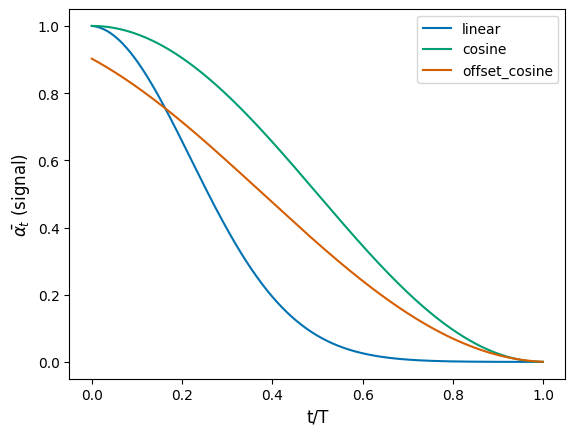

In [ ]:
plt.plot(
    diffusion_times, linear_signal_rates**2, linewidth=1.5, label="linear"
)
plt.plot(
    diffusion_times, cosine_signal_rates**2, linewidth=1.5, label="cosine"
)
plt.plot(
    diffusion_times,
    offset_cosine_signal_rates**2,
    linewidth=1.5,
    label="offset_cosine",
)

plt.xlabel("t/T", fontsize=12)
plt.ylabel(r"$\bar{\alpha_t}$ (signal)", fontsize=12)
plt.legend()
plt.show()

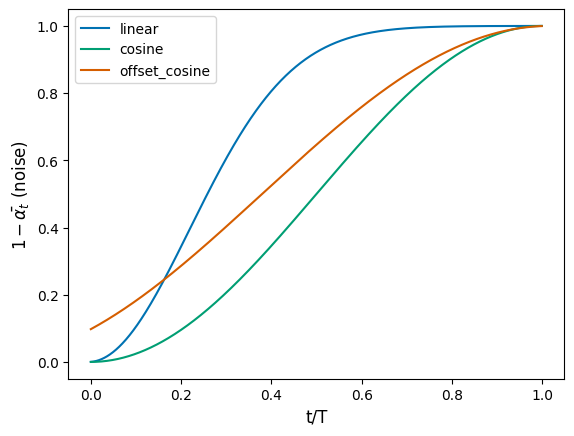

In [ ]:
plt.plot(
    diffusion_times, linear_noise_rates**2, linewidth=1.5, label="linear"
)
plt.plot(
    diffusion_times, cosine_noise_rates**2, linewidth=1.5, label="cosine"
)
plt.plot(
    diffusion_times,
    offset_cosine_noise_rates**2,
    linewidth=1.5,
    label="offset_cosine",
)

plt.xlabel("t/T", fontsize=12)
plt.ylabel(r"$1-\bar{\alpha_t}$ (noise)", fontsize=12)
plt.legend()
plt.show()

In [ ]:
def sinusoidal_embedding(x):
    frequencies = tf.exp(
        tf.linspace(
            tf.math.log(1.0),
            tf.math.log(1000.0),
            NOISE_EMBEDDING_SIZE // 2,
        )
    )
    angular_speeds = 2.0 * math.pi * frequencies
    embeddings = tf.concat(
        [tf.sin(angular_speeds * x), tf.cos(angular_speeds * x)], axis=3
    )
    return embeddings

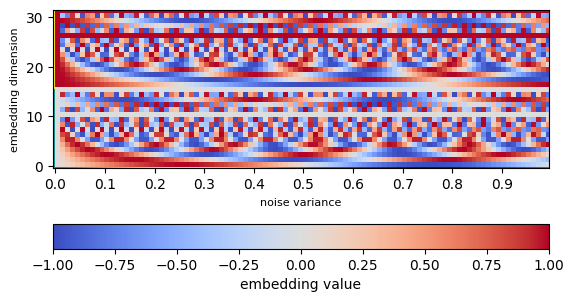

In [ ]:
embedding_list = []
for y in np.arange(0, 1, 0.01):
    embedding_list.append(sinusoidal_embedding(np.array([[[[y]]]]))[0][0][0])
embedding_array = np.array(np.transpose(embedding_list))
fig, ax = plt.subplots()
ax.set_xticks(
    np.arange(0, 100, 10), labels=np.round(np.arange(0.0, 1.0, 0.1), 1)
)
ax.set_ylabel("embedding dimension", fontsize=8)
ax.set_xlabel("noise variance", fontsize=8)
plt.pcolor(embedding_array, cmap="coolwarm")
plt.colorbar(orientation="horizontal", label="embedding value")
ax.imshow(embedding_array, interpolation="nearest", origin="lower")
plt.show()

In [ ]:
def ResidualBlock(width):
    def apply(x):
        input_width = x.shape[3]
        if input_width == width:
            residual = x
        else:
            residual = layers.Conv2D(width, kernel_size=1)(x)
        x = layers.BatchNormalization(center=False, scale=False)(x)
        x = layers.Conv2D(
            width, kernel_size=3, padding="same", activation=activations.swish
        )(x)
        x = layers.Conv2D(width, kernel_size=3, padding="same")(x)
        x = layers.Add()([x, residual])
        return x

    return apply

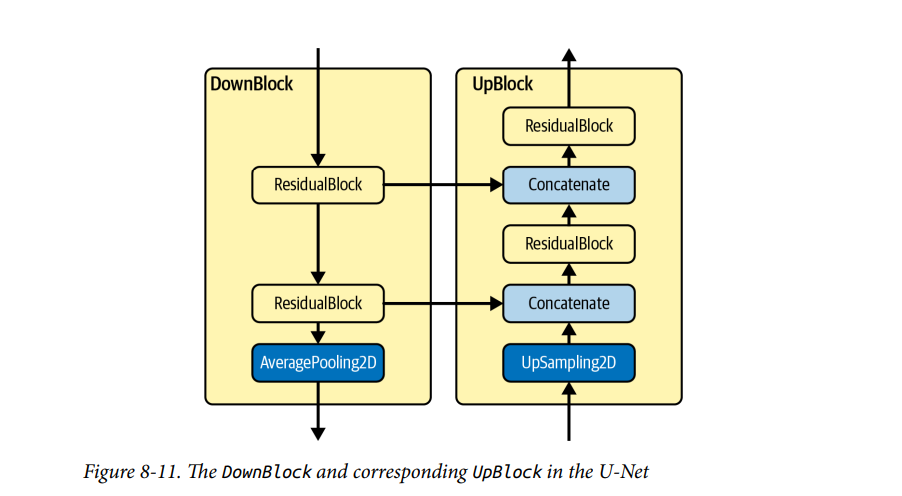

Each successive DownBlock increases the number of channels via block_depth (=2 in
our example) ResidualBlocks, while also applying a final AveragePooling2D layer in
order to halve the size of the image. Each ResidualBlock is added to a list for use
later by the UpBlock layers as skip connections across the U-Net.


An UpBlock first applies an UpSampling2D layer that doubles the size of the image,
through bilinear interpolation. Each successive UpBlock decreases the number of
channels via block_depth (=2) ResidualBlocks, while also concatenating the outputs
from the DownBlocks through skip connections across the U-Net

In [ ]:
def DownBlock(width, block_depth):
    def apply(x):
        x, skips = x
        for _ in range(block_depth):
            x = ResidualBlock(width)(x)
            skips.append(x)
        x = layers.AveragePooling2D(pool_size=2)(x)
        return x

    return apply


def UpBlock(width, block_depth):
    def apply(x):
        x, skips = x
        x = layers.UpSampling2D(size=2, interpolation="bilinear")(x)
        for _ in range(block_depth):
            x = layers.Concatenate()([x, skips.pop()])
            x = ResidualBlock(width)(x)
        return x

    return apply

In [ ]:
# Build the U-Net

noisy_images = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
x = layers.Conv2D(32, kernel_size=1)(noisy_images)

noise_variances = layers.Input(shape=(1, 1, 1))
noise_embedding = layers.Lambda(sinusoidal_embedding)(noise_variances)
noise_embedding = layers.UpSampling2D(size=IMAGE_SIZE, interpolation="nearest")(
    noise_embedding
)

x = layers.Concatenate()([x, noise_embedding])

skips = []

x = DownBlock(32, block_depth=2)([x, skips])
x = DownBlock(64, block_depth=2)([x, skips])
x = DownBlock(96, block_depth=2)([x, skips])

x = ResidualBlock(128)(x)
x = ResidualBlock(128)(x)

x = UpBlock(96, block_depth=2)([x, skips])
x = UpBlock(64, block_depth=2)([x, skips])
x = UpBlock(32, block_depth=2)([x, skips])

x = layers.Conv2D(3, kernel_size=1, kernel_initializer="zeros")(x)

unet = models.Model([noisy_images, noise_variances], x, name="unet")

# Sampling from the Denoising Diffusion Model


We must bear in mind that our model is trained to predict the total amount of noise
that has been added to a given noisy image from the training set, not just the noise
that was added at the last timestep of the noising process. However, we do not want to
undo the noise all in one go—predicting an image from pure random noise in one
shot is clearly not going to work! We would rather mimic the forward process and
undo the predicted noise gradually over many small steps, to allow the model to
adjust to its own predictions

To achieve this, we can jump from xt to xt − 1in two steps—first by using our model’s
noise prediction to calculate an estimate for the original image x0 and then by reap‐
plying the predicted noise to this image, but only over t− 1 timesteps, to produce
xt − 1

If we repeat this process over a number of steps, we’ll eventually get back to an esti‐
mate for x0 that has been guided gradually over many small steps

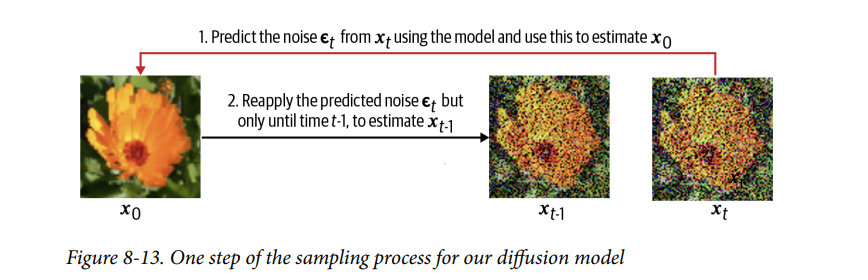

In [ ]:
class DiffusionModel(models.Model):
    def __init__(self):
        super().__init__()

        self.normalizer = layers.Normalization()
        self.network = unet
        self.ema_network = models.clone_model(self.network)
        self.diffusion_schedule = offset_cosine_diffusion_schedule

    def compile(self, **kwargs):
        super().compile(**kwargs)
        self.noise_loss_tracker = metrics.Mean(name="n_loss")

    @property
    def metrics(self):
        return [self.noise_loss_tracker]

    def denormalize(self, images):
        images = self.normalizer.mean + images * self.normalizer.variance**0.5
        return tf.clip_by_value(images, 0.0, 1.0)

    def denoise(self, noisy_images, noise_rates, signal_rates, training):
        if training:
            network = self.network
        else:
            network = self.ema_network
        pred_noises = network(
            [noisy_images, noise_rates**2], training=training
        )
        pred_images = (noisy_images - noise_rates * pred_noises) / signal_rates

        return pred_noises, pred_images

    def reverse_diffusion(self, initial_noise, diffusion_steps):
        num_images = initial_noise.shape[0]
        step_size = 1.0 / diffusion_steps
        current_images = initial_noise
        for step in range(diffusion_steps):
            diffusion_times = tf.ones((num_images, 1, 1, 1)) - step * step_size
            noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
            pred_noises, pred_images = self.denoise(
                current_images, noise_rates, signal_rates, training=False
            )
            next_diffusion_times = diffusion_times - step_size
            next_noise_rates, next_signal_rates = self.diffusion_schedule(
                next_diffusion_times
            )
            current_images = (
                next_signal_rates * pred_images + next_noise_rates * pred_noises
            )
        return pred_images

    def generate(self, num_images, diffusion_steps, initial_noise=None):
        if initial_noise is None:
            initial_noise = tf.random.normal(
                shape=(num_images, IMAGE_SIZE, IMAGE_SIZE, 3)
            )
        generated_images = self.reverse_diffusion(
            initial_noise, diffusion_steps
        )
        generated_images = self.denormalize(generated_images)
        return generated_images

    def train_step(self, images):
        images = self.normalizer(images, training=True)
        noises = tf.random.normal(shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, 3))

        diffusion_times = tf.random.uniform(
            shape=(BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)

        noisy_images = signal_rates * images + noise_rates * noises

        with tf.GradientTape() as tape:
            # train the network to separate noisy images to their components
            pred_noises, pred_images = self.denoise(
                noisy_images, noise_rates, signal_rates, training=True
            )

            noise_loss = self.loss(noises, pred_noises)  # used for training

        gradients = tape.gradient(noise_loss, self.network.trainable_weights)
        self.optimizer.apply_gradients(
            zip(gradients, self.network.trainable_weights)
        )

        self.noise_loss_tracker.update_state(noise_loss)

        for weight, ema_weight in zip(
            self.network.weights, self.ema_network.weights
        ):
            ema_weight.assign(EMA * ema_weight + (1 - EMA) * weight)

        return {m.name: m.result() for m in self.metrics}

    def test_step(self, images):
        images = self.normalizer(images, training=False)
        noises = tf.random.normal(shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, 3))
        diffusion_times = tf.random.uniform(
            shape=(BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
        noisy_images = signal_rates * images + noise_rates * noises
        pred_noises, pred_images = self.denoise(
            noisy_images, noise_rates, signal_rates, training=False
        )
        noise_loss = self.loss(noises, pred_noises)
        self.noise_loss_tracker.update_state(noise_loss)

        return {m.name: m.result() for m in self.metrics}

In [ ]:
ddm = DiffusionModel()
ddm.normalizer.adapt(train)

In [ ]:
ddm.compile(
    optimizer=optimizers.experimental.AdamW(
        learning_rate=LEARNING_RATE, weight_decay=WEIGHT_DECAY
    ),
    loss=losses.mean_absolute_error,
)

Epoch 1/50
  6/639 [..............................] - ETA: 1:51 - n_loss: 0.7800

639/639 [==============================] - ETA: 0s - n_loss: 0.2350

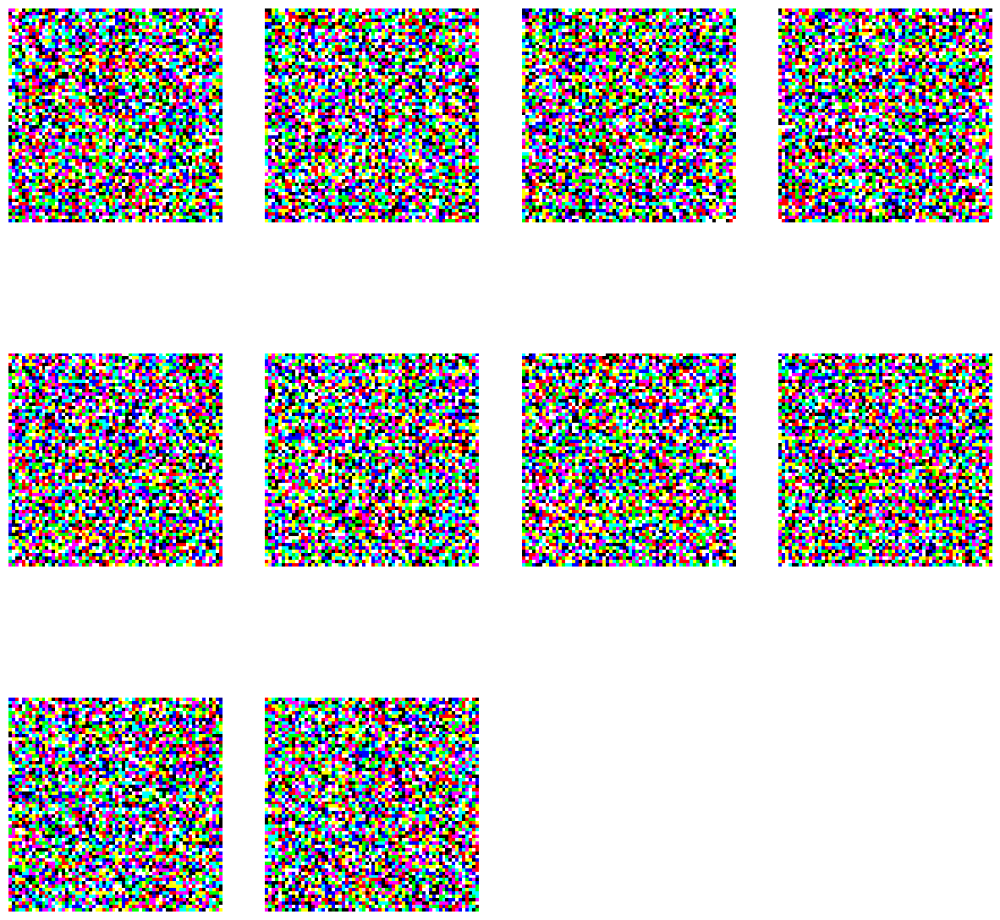

639/639 [==============================] - 144s 186ms/step - n_loss: 0.2350
Epoch 2/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1952

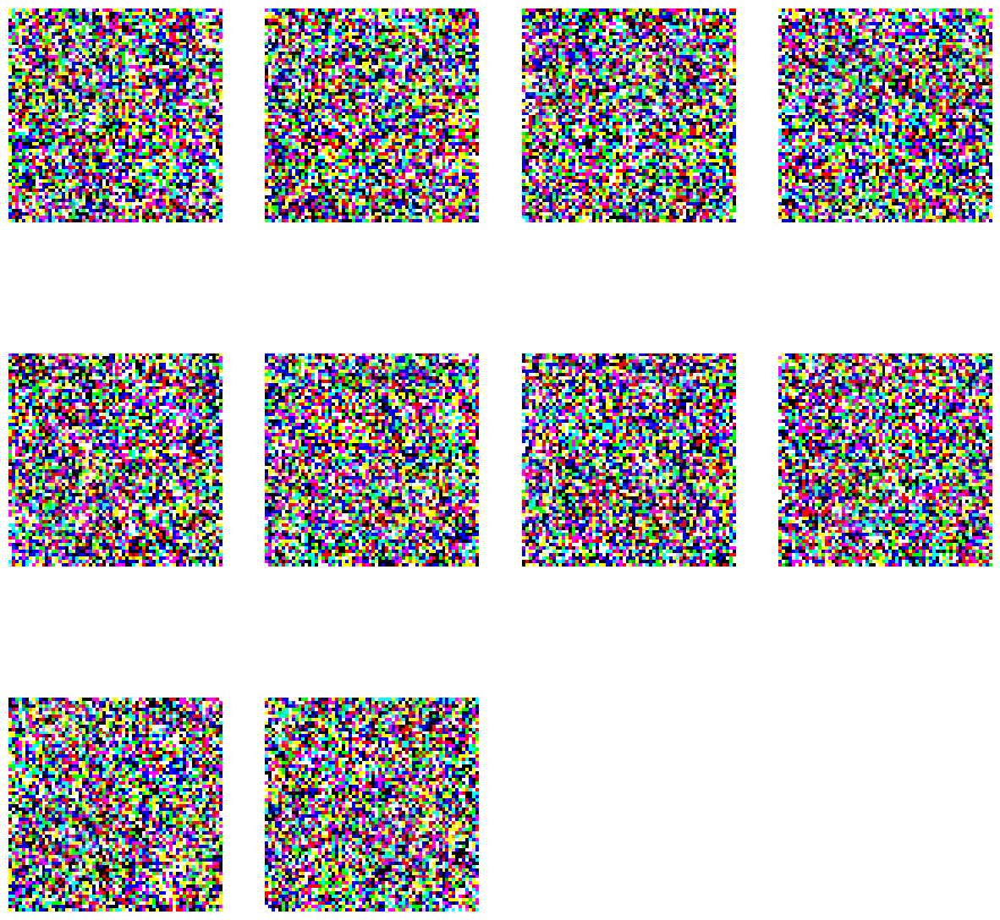

639/639 [==============================] - 127s 195ms/step - n_loss: 0.1952
Epoch 3/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1890

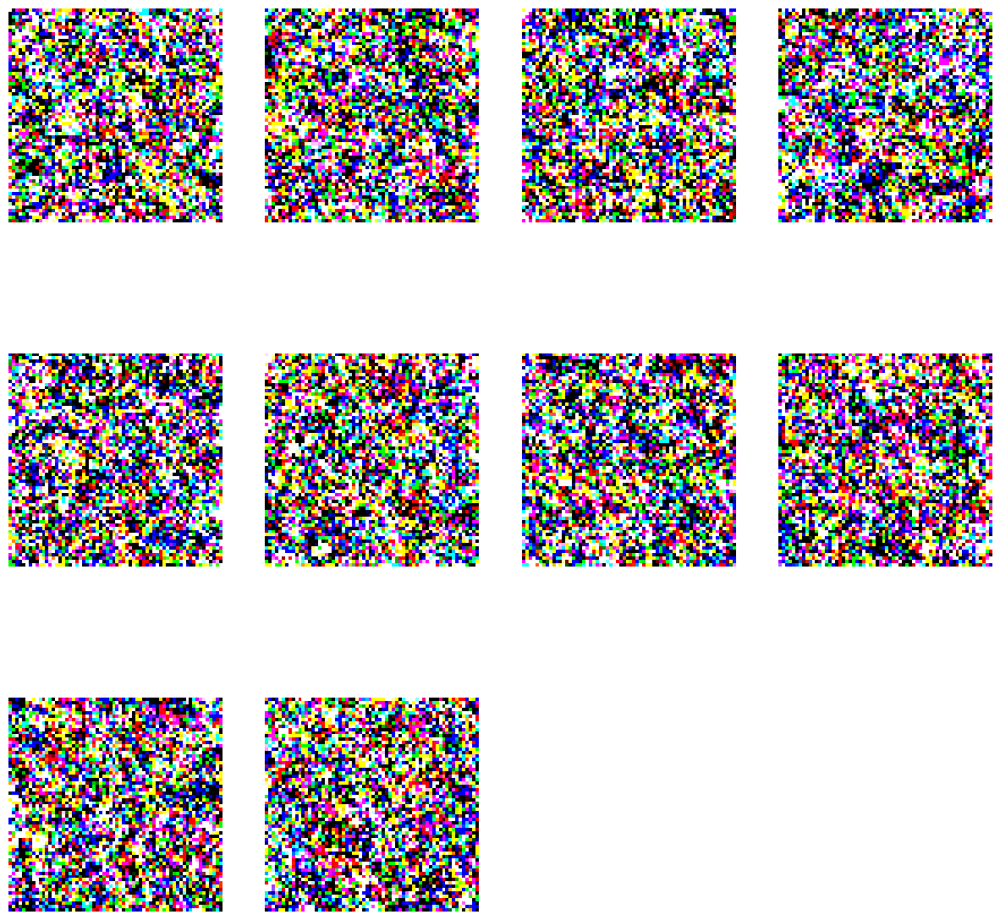

639/639 [==============================] - 124s 192ms/step - n_loss: 0.1890
Epoch 4/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1860

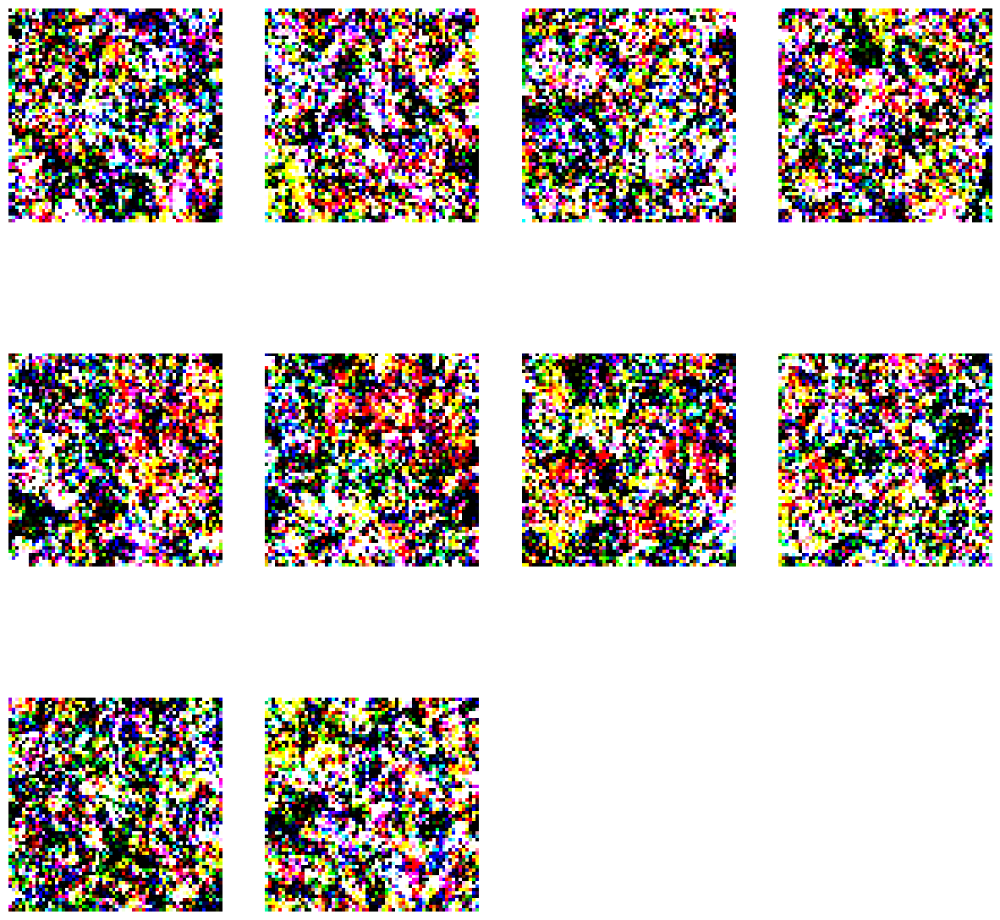

639/639 [==============================] - 125s 194ms/step - n_loss: 0.1860
Epoch 5/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1835

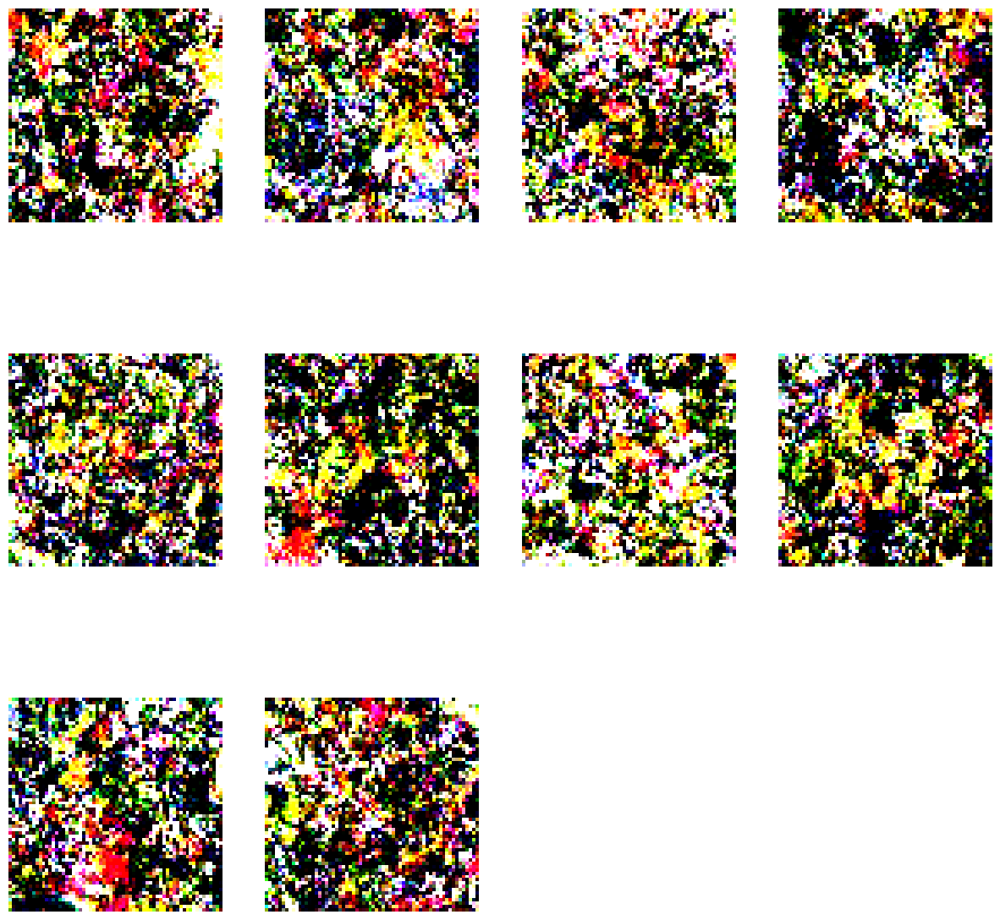

639/639 [==============================] - 125s 194ms/step - n_loss: 0.1835
Epoch 6/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1810

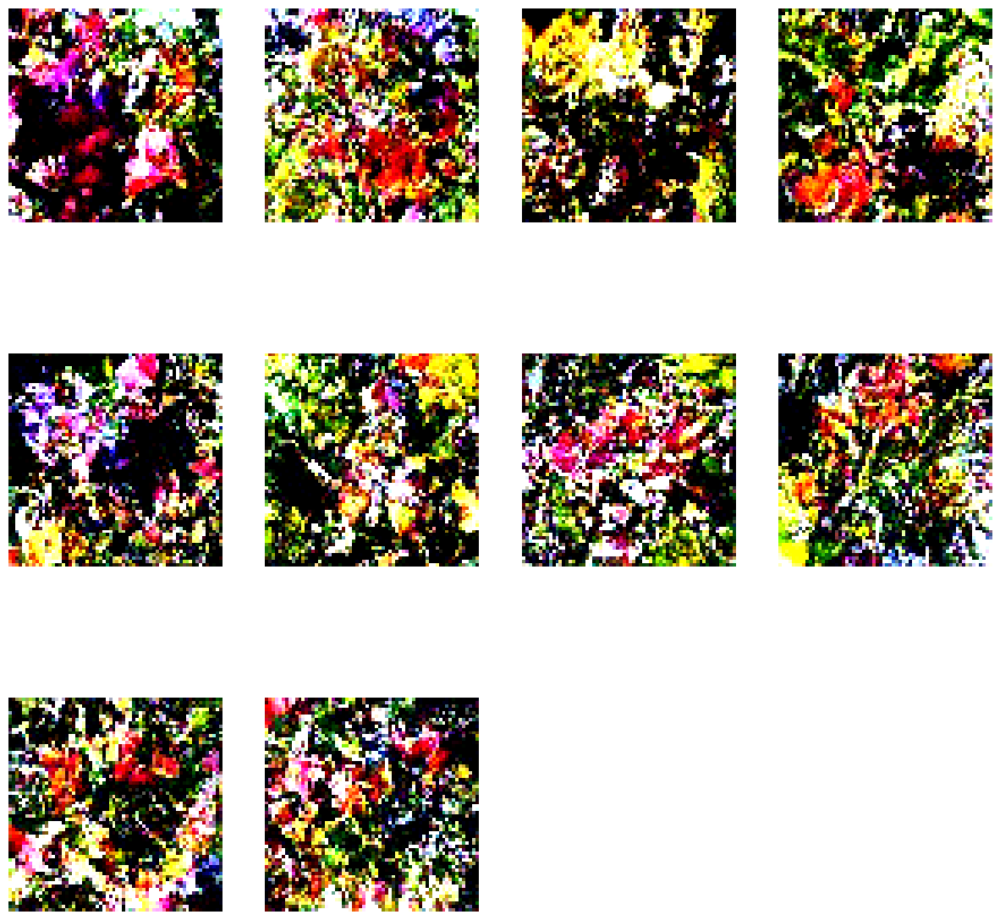

639/639 [==============================] - 126s 195ms/step - n_loss: 0.1810
Epoch 7/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1806

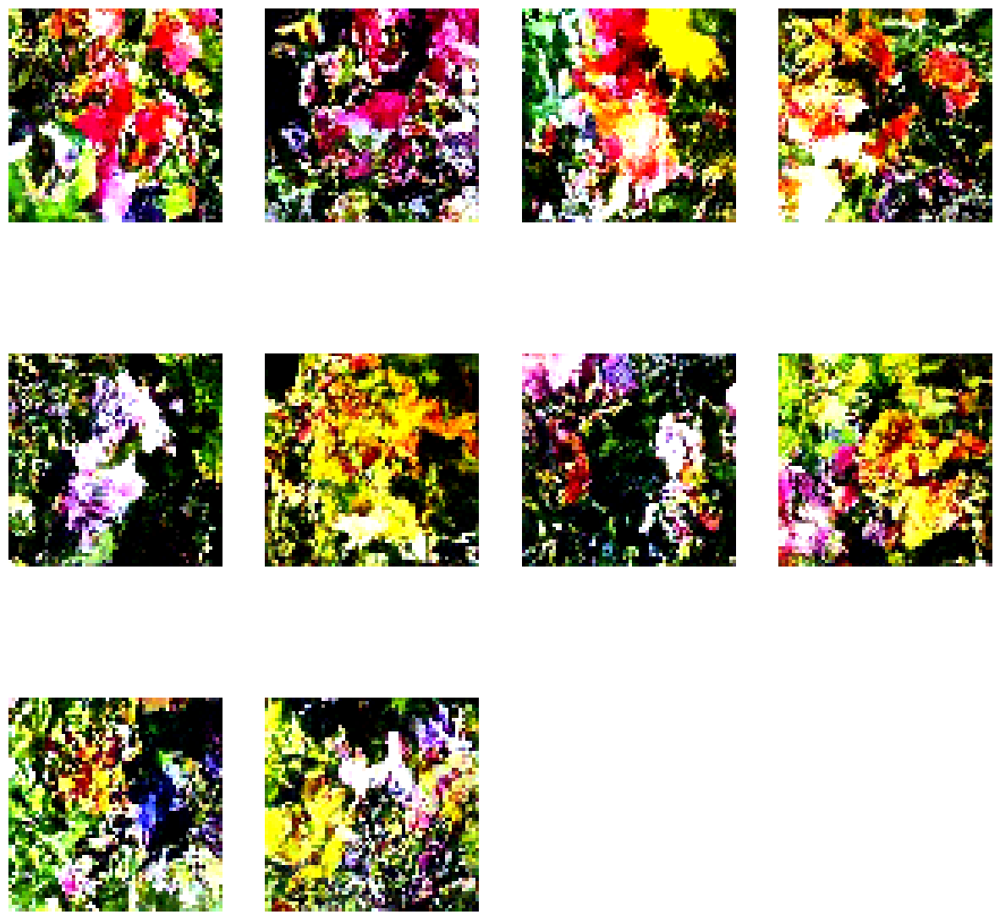

639/639 [==============================] - 125s 194ms/step - n_loss: 0.1806
Epoch 8/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1799

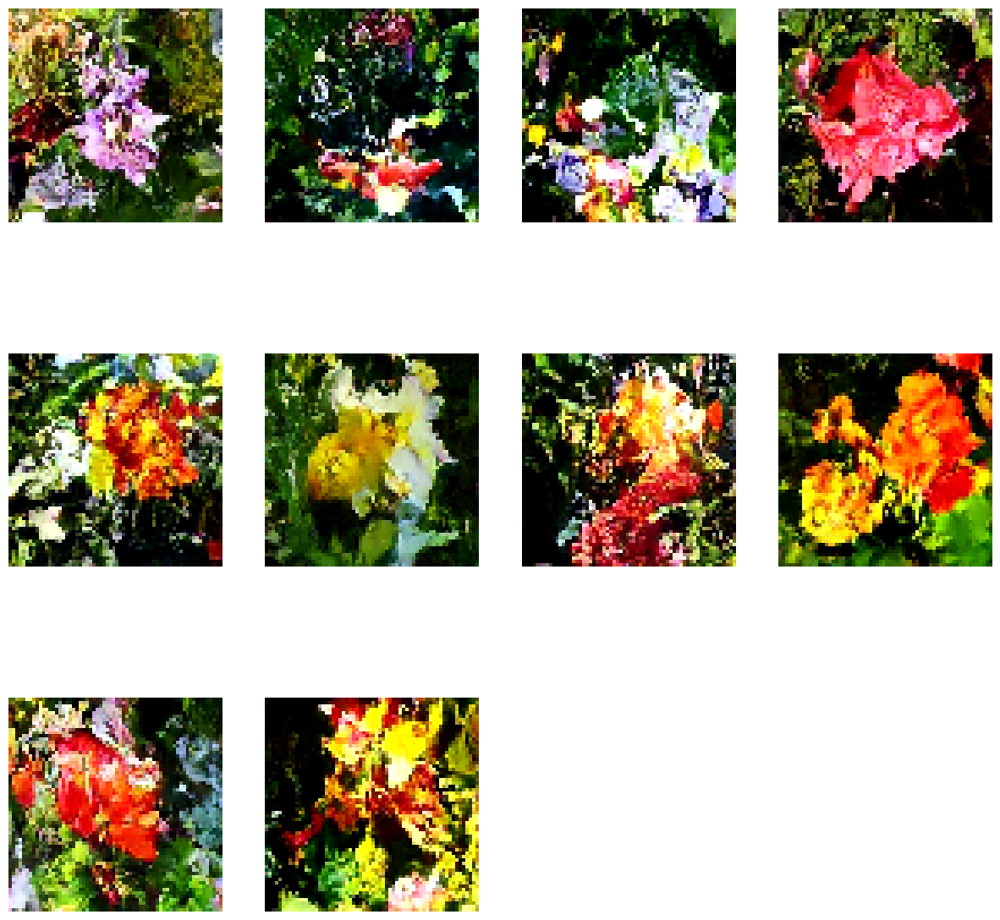

639/639 [==============================] - 127s 196ms/step - n_loss: 0.1799
Epoch 9/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1790

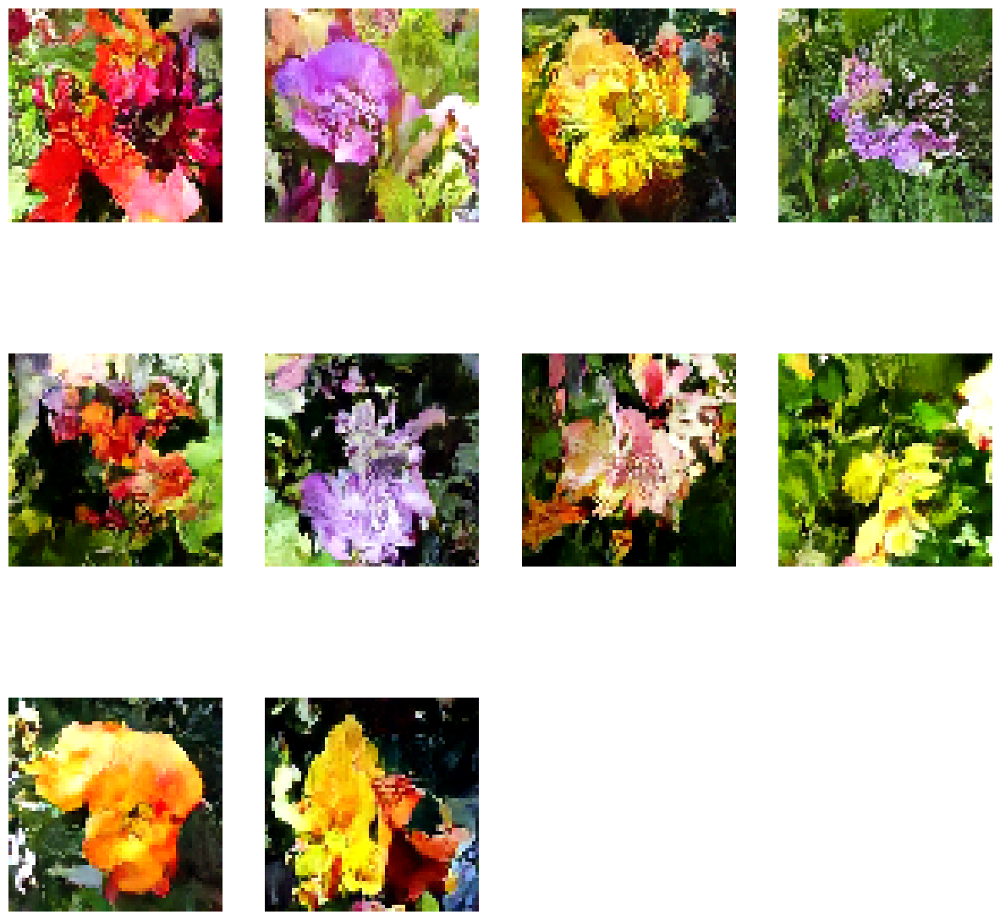

639/639 [==============================] - 126s 195ms/step - n_loss: 0.1790
Epoch 10/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1789

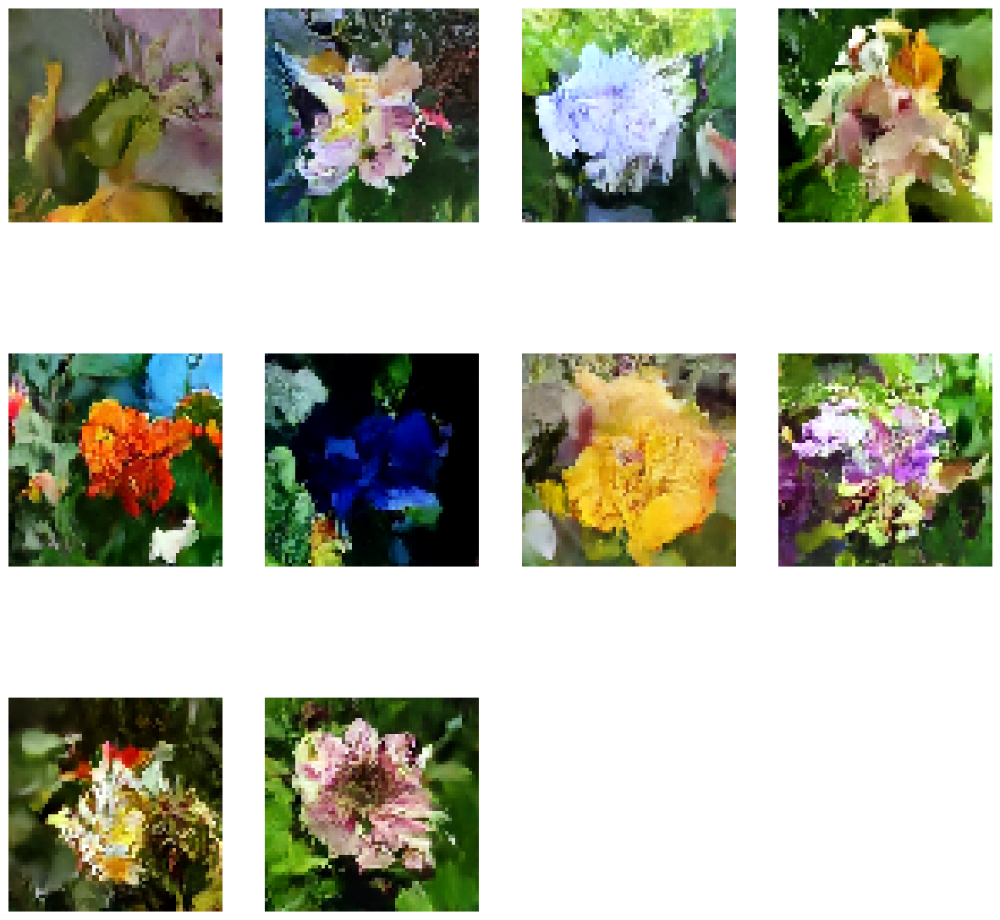

639/639 [==============================] - 125s 195ms/step - n_loss: 0.1789
Epoch 11/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1775

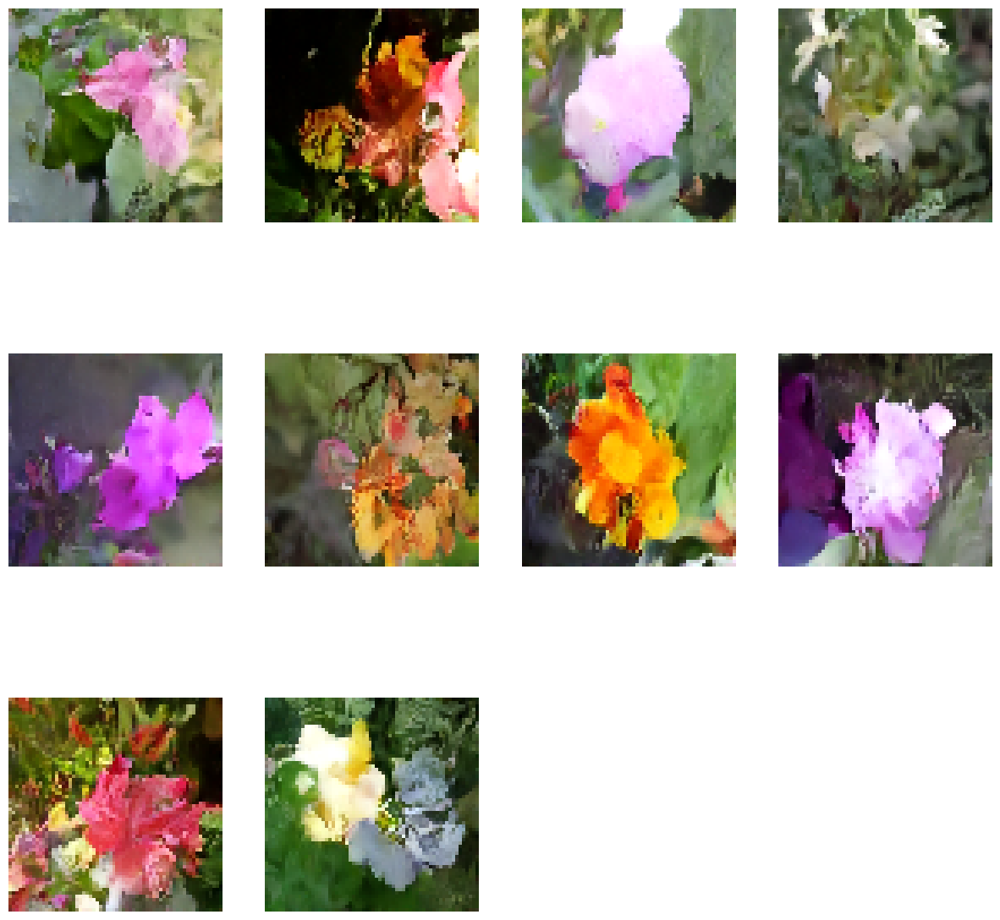

639/639 [==============================] - 128s 199ms/step - n_loss: 0.1775
Epoch 12/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1770

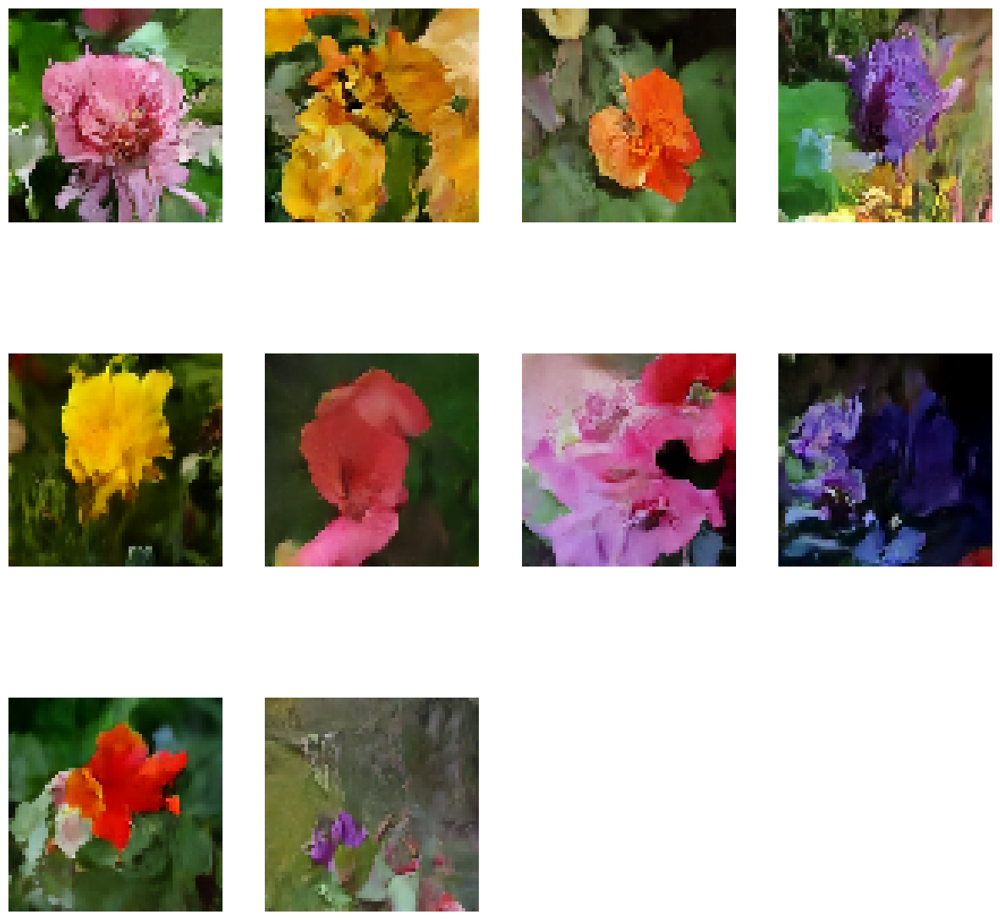

639/639 [==============================] - 129s 200ms/step - n_loss: 0.1770
Epoch 13/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1769

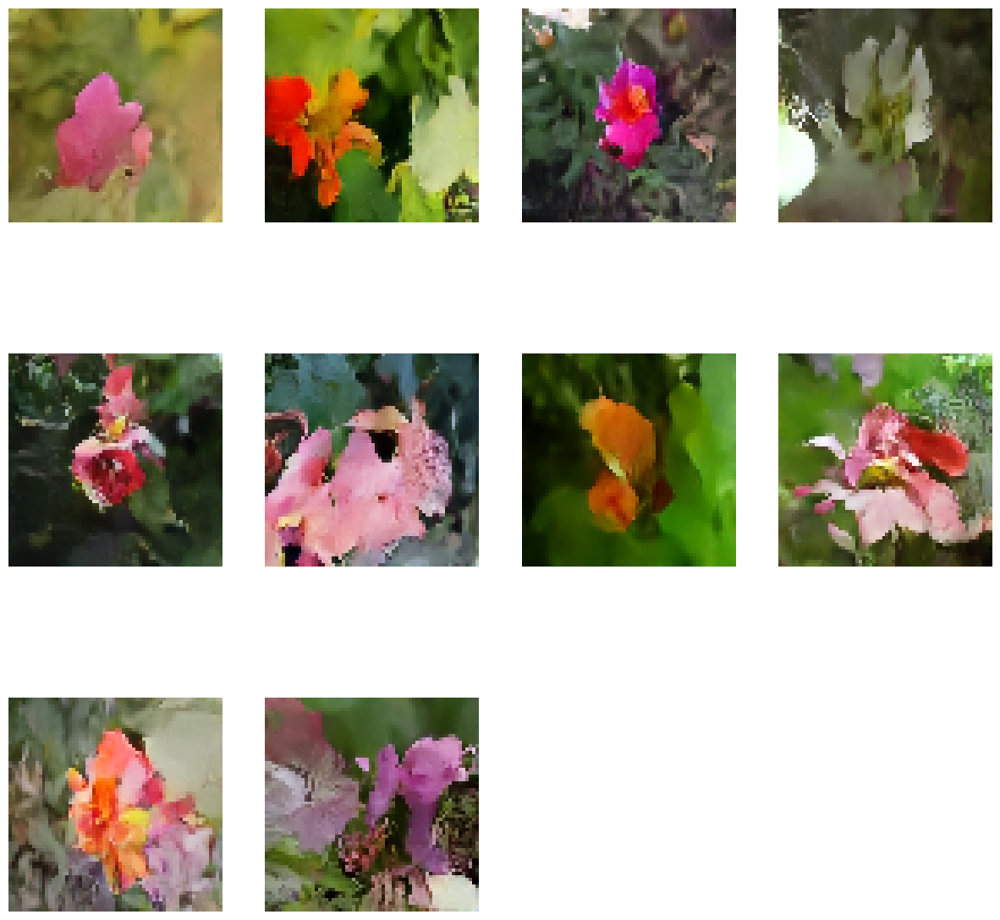

639/639 [==============================] - 127s 196ms/step - n_loss: 0.1769
Epoch 14/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1768

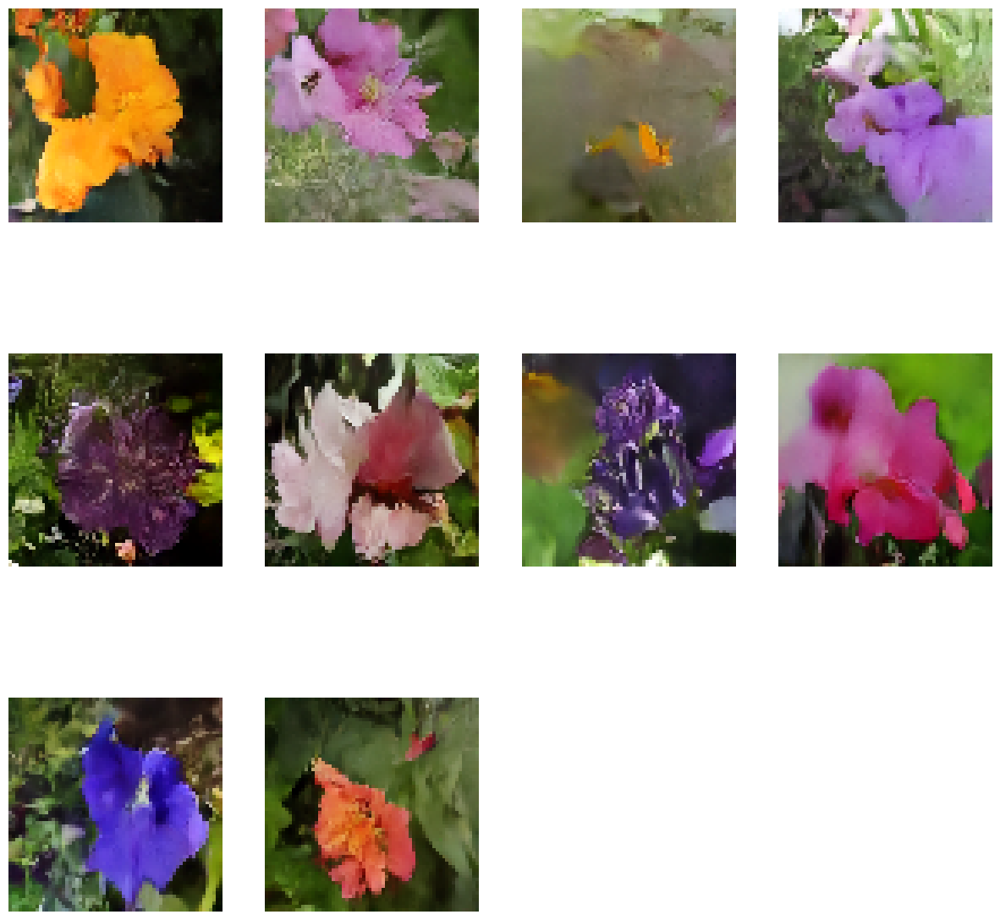

639/639 [==============================] - 126s 196ms/step - n_loss: 0.1768
Epoch 15/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1765

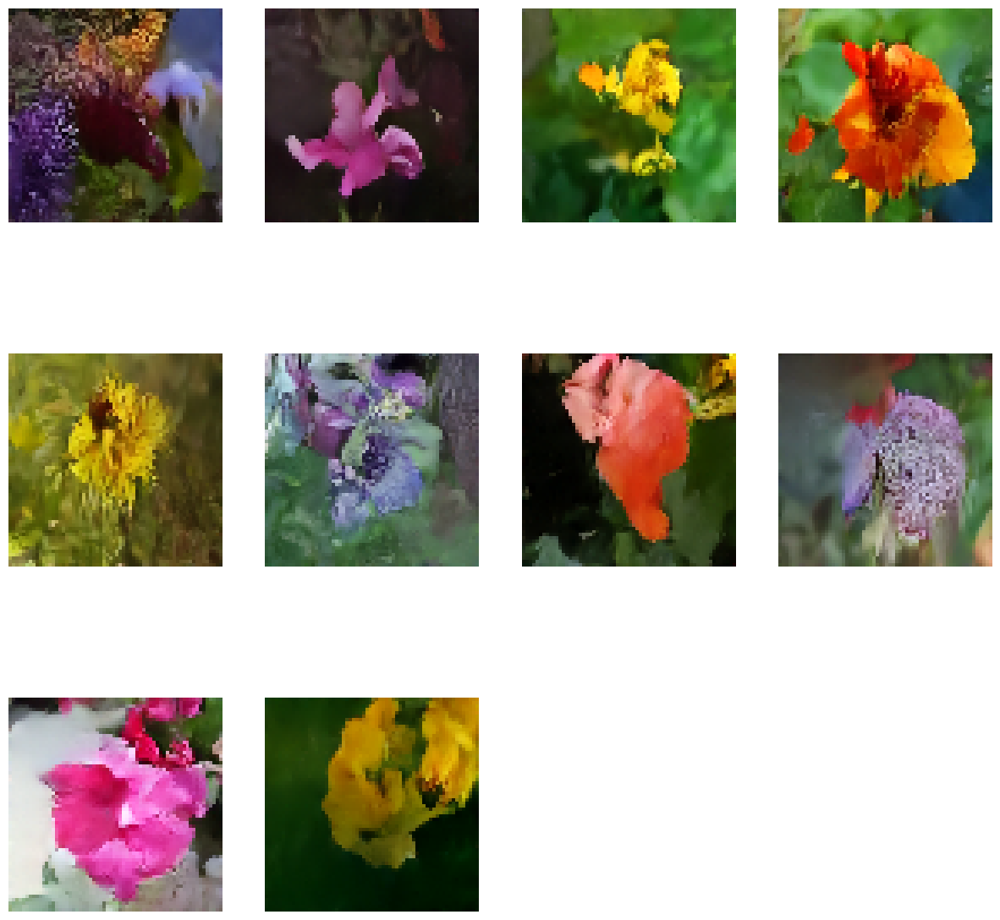

639/639 [==============================] - 126s 195ms/step - n_loss: 0.1765
Epoch 16/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1750

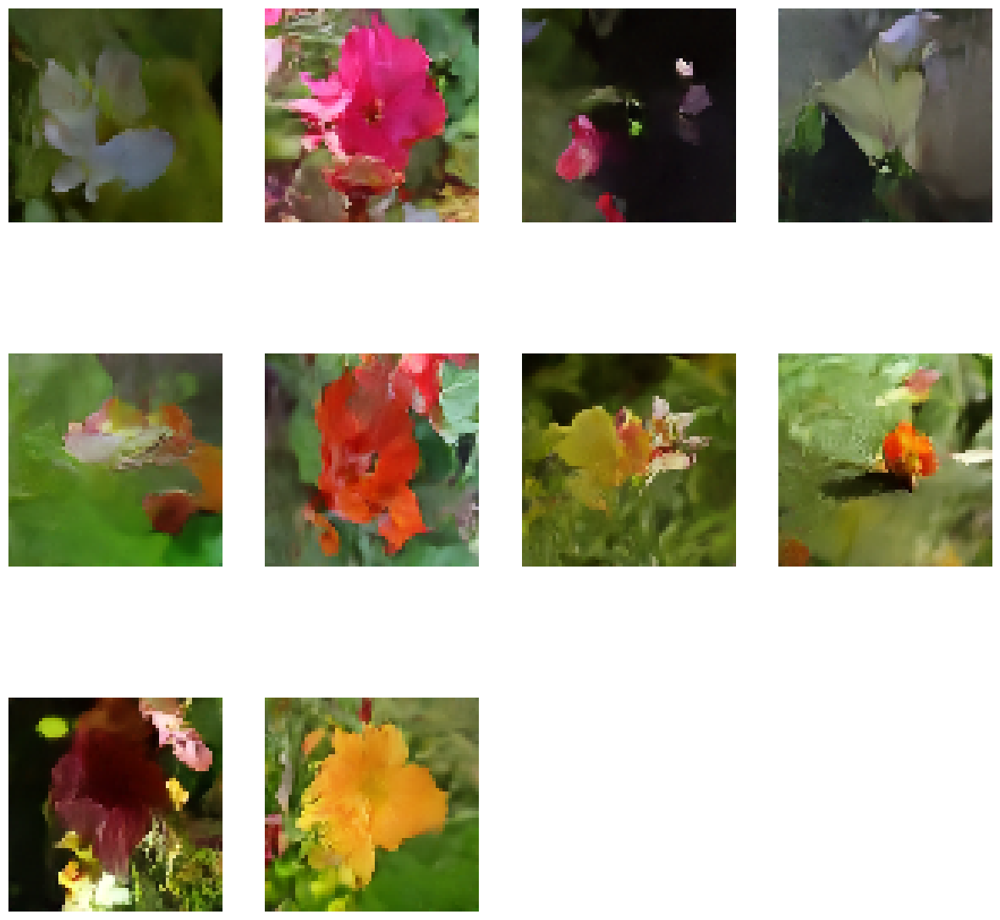

639/639 [==============================] - 127s 196ms/step - n_loss: 0.1750
Epoch 17/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1756

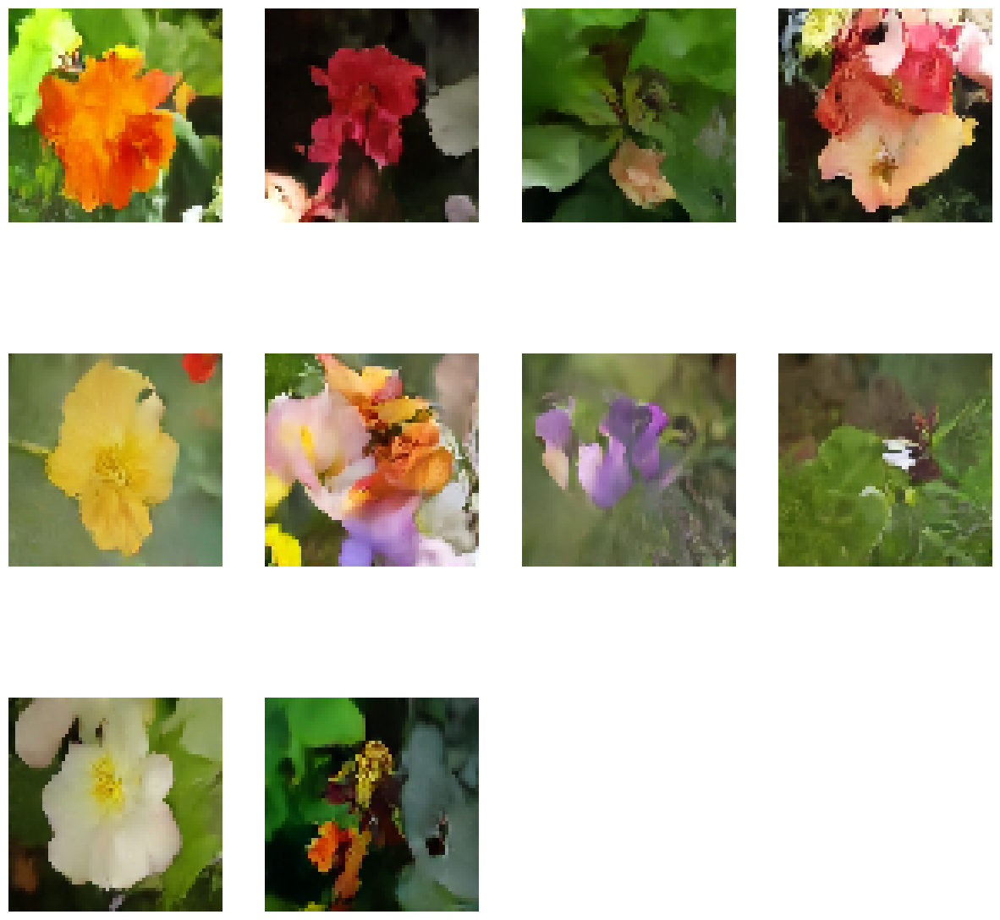

639/639 [==============================] - 127s 196ms/step - n_loss: 0.1756
Epoch 18/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1750

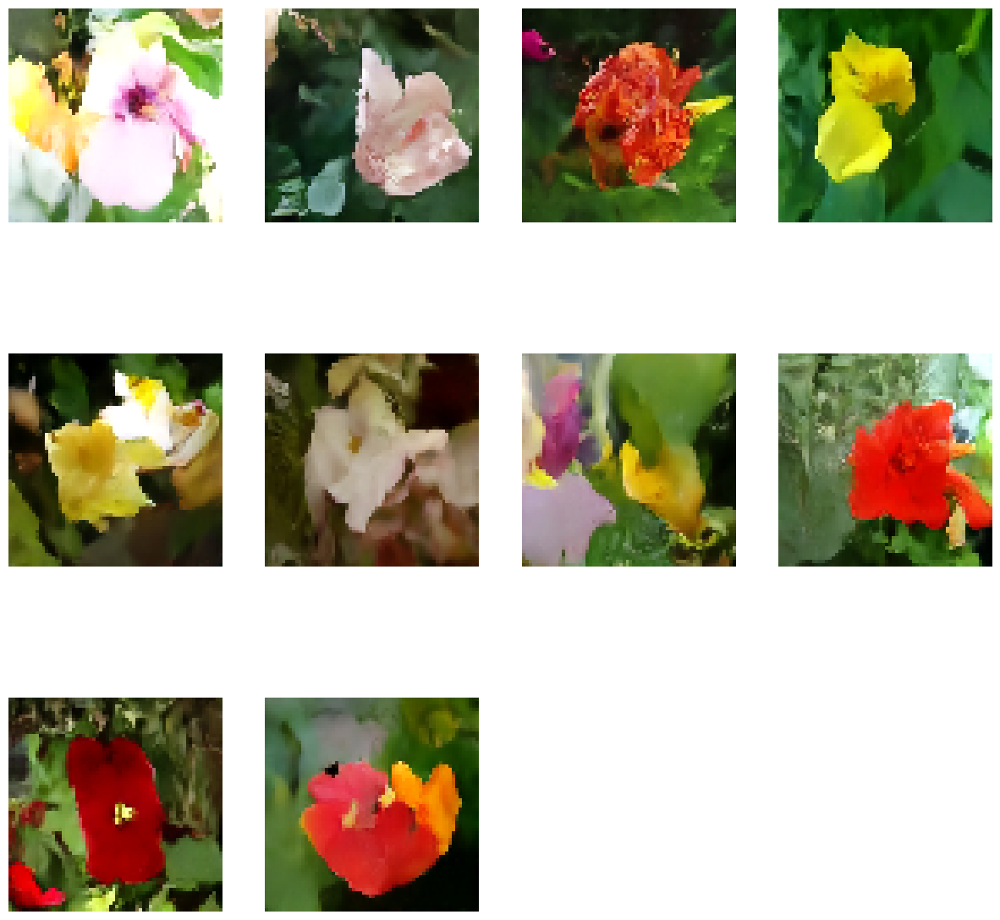

639/639 [==============================] - 127s 196ms/step - n_loss: 0.1750
Epoch 19/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1757

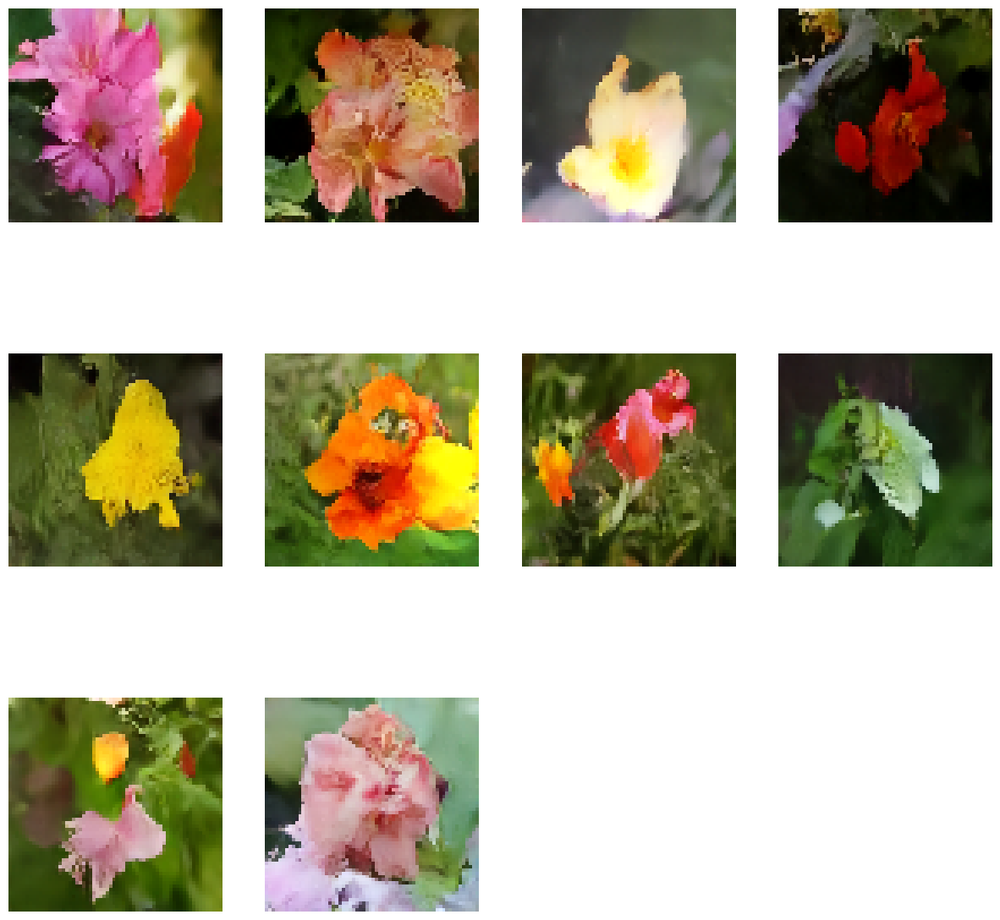

639/639 [==============================] - 126s 196ms/step - n_loss: 0.1757
Epoch 20/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1749

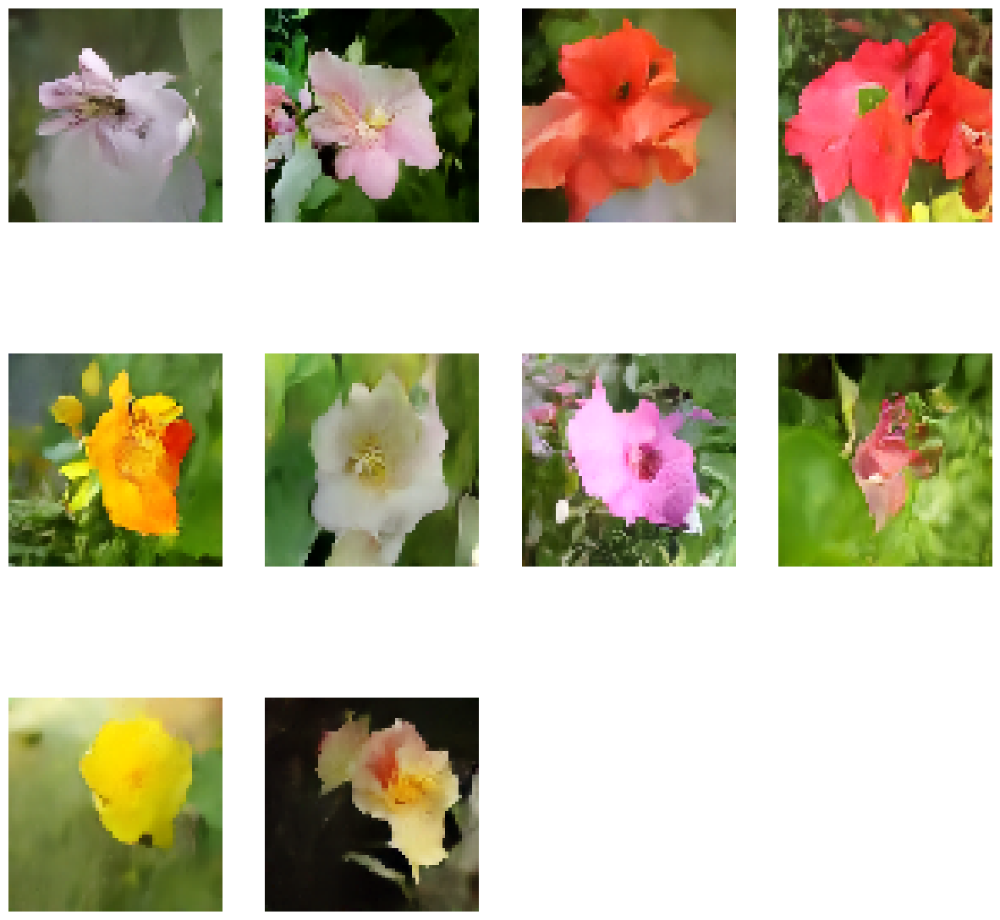

639/639 [==============================] - 128s 198ms/step - n_loss: 0.1749
Epoch 21/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1743

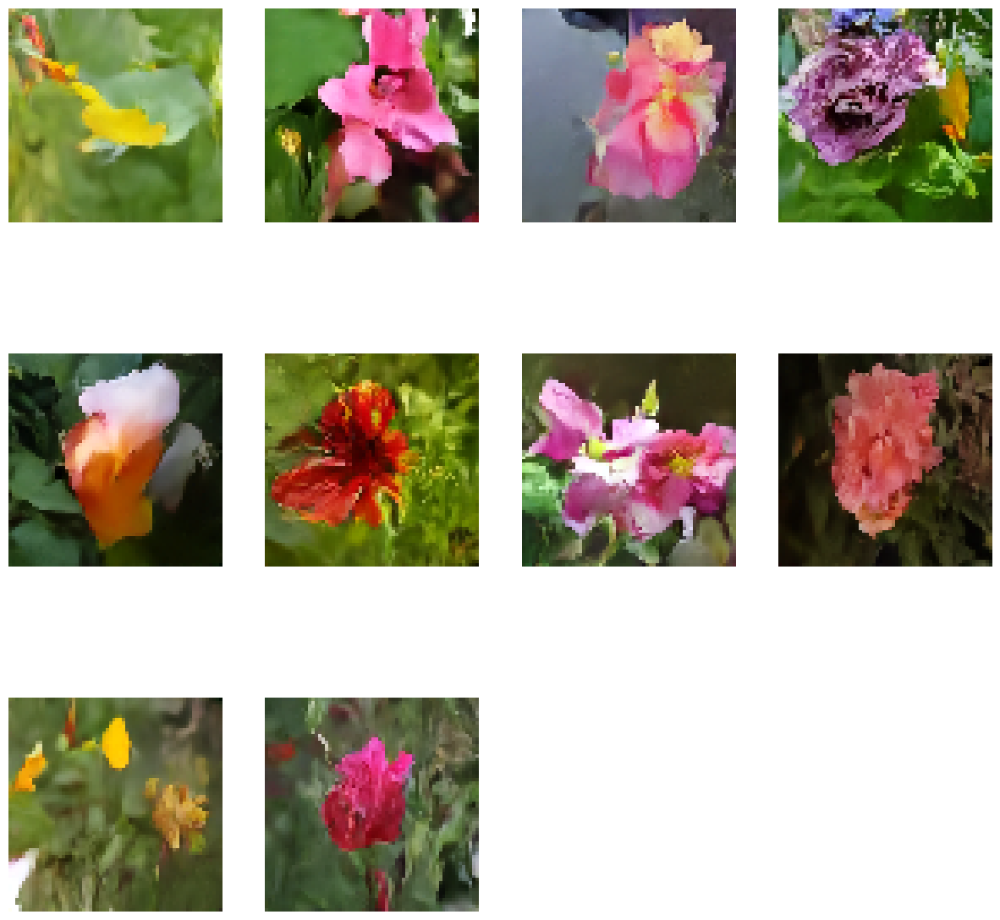

639/639 [==============================] - 129s 199ms/step - n_loss: 0.1743
Epoch 22/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1746

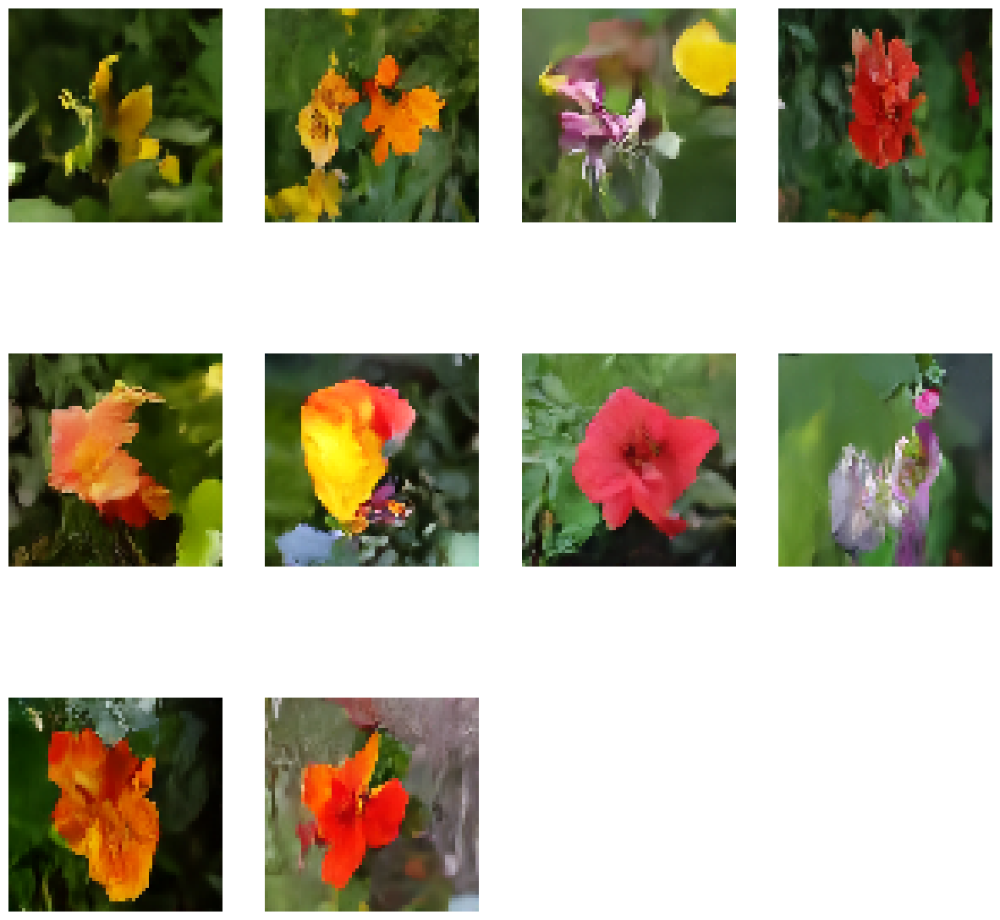

639/639 [==============================] - 129s 200ms/step - n_loss: 0.1746
Epoch 23/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1736

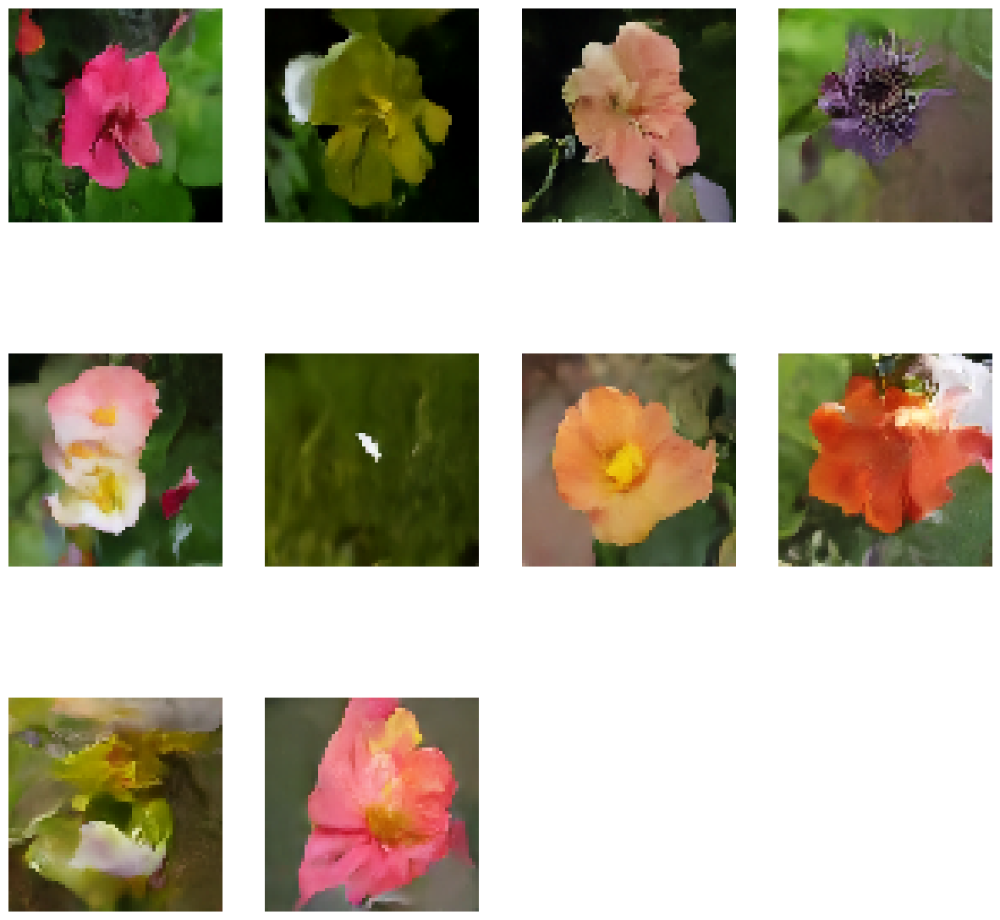

639/639 [==============================] - 128s 199ms/step - n_loss: 0.1736
Epoch 24/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1744

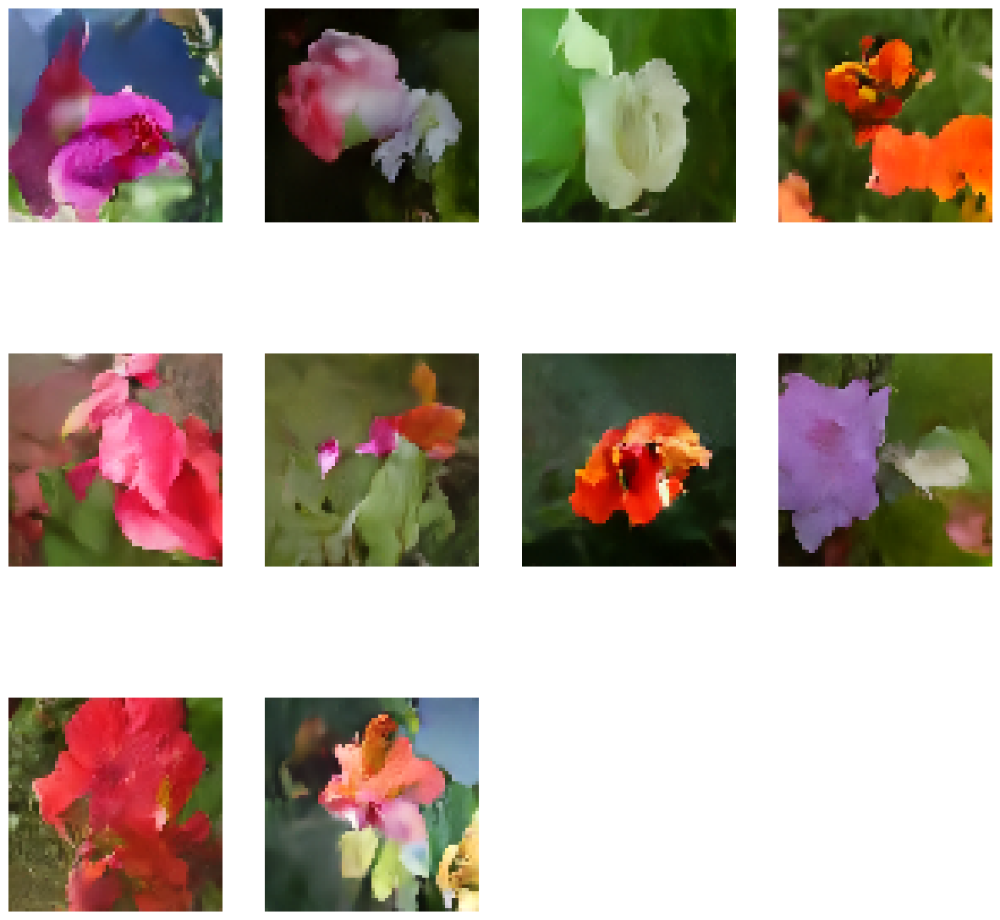

639/639 [==============================] - 128s 199ms/step - n_loss: 0.1744
Epoch 25/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1736

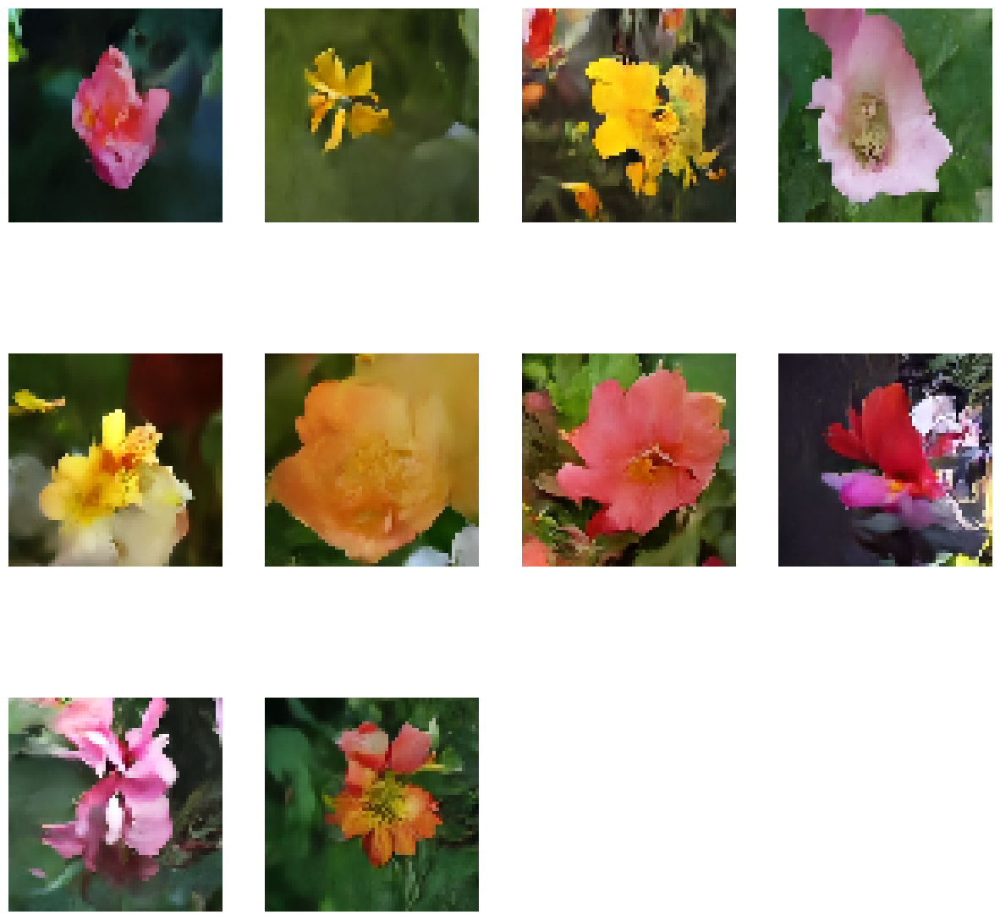

639/639 [==============================] - 128s 198ms/step - n_loss: 0.1736
Epoch 26/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1741

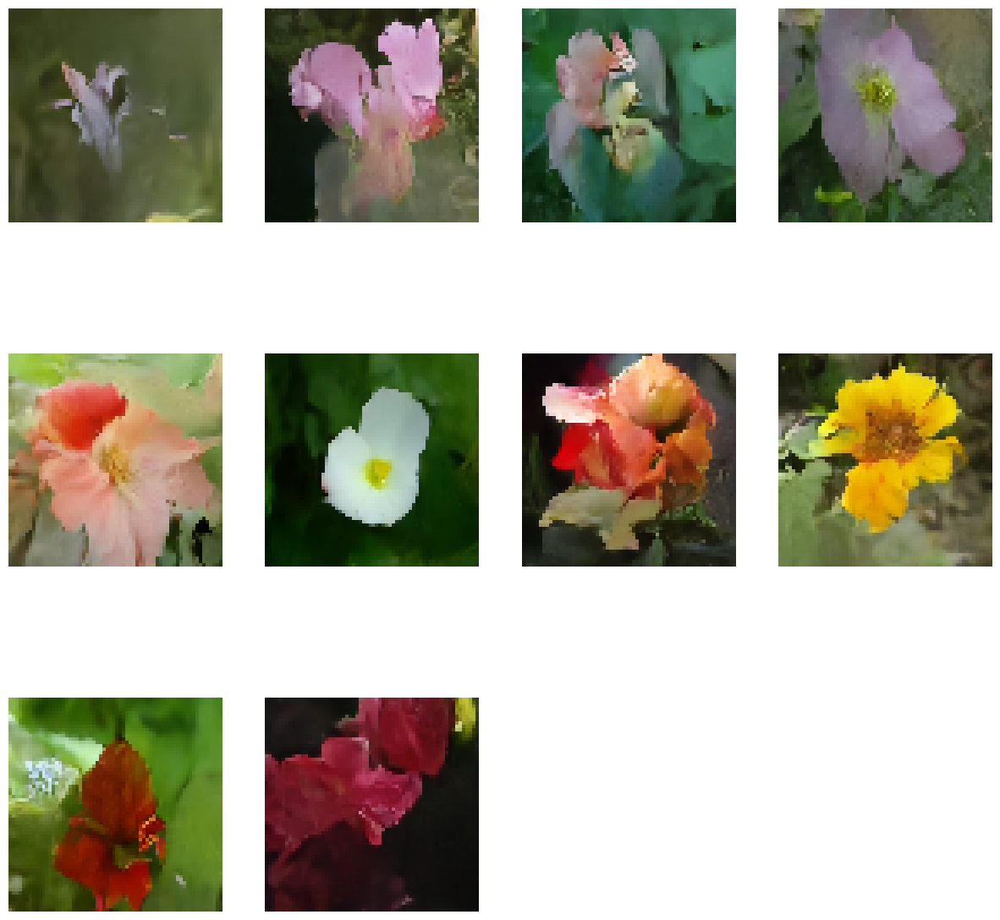

639/639 [==============================] - 128s 199ms/step - n_loss: 0.1741
Epoch 27/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1741

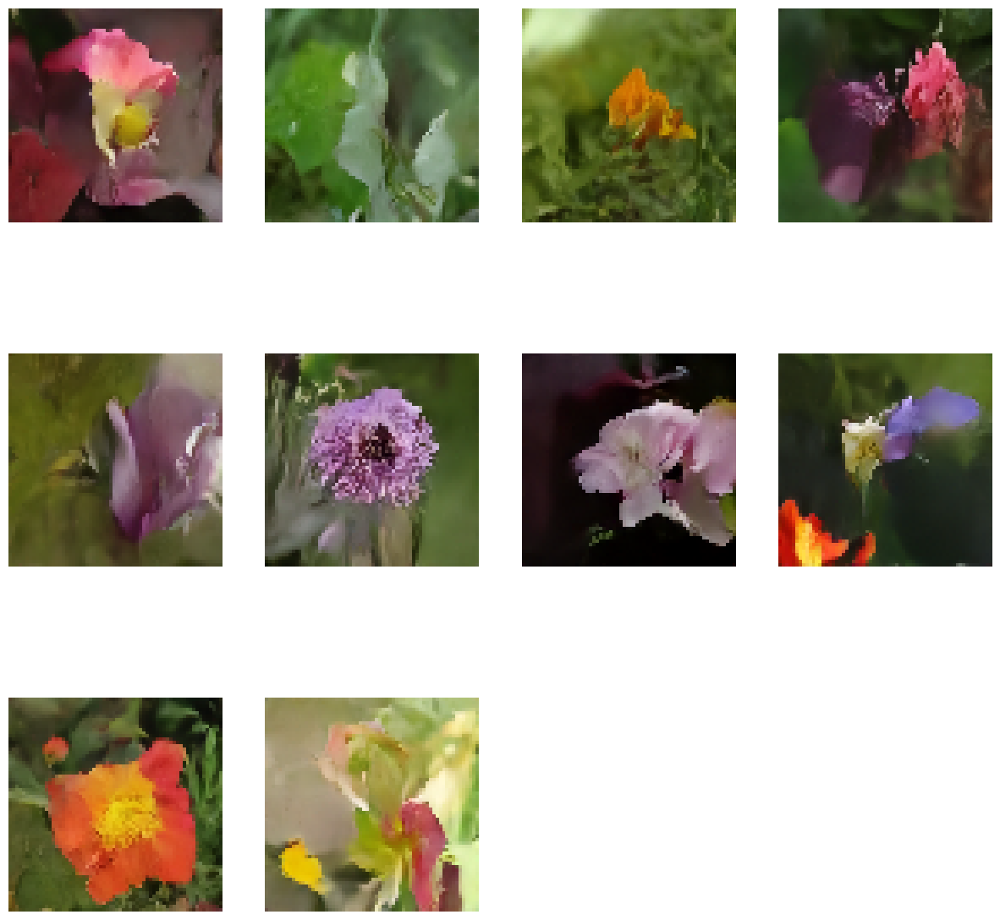

639/639 [==============================] - 128s 198ms/step - n_loss: 0.1741
Epoch 28/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1734

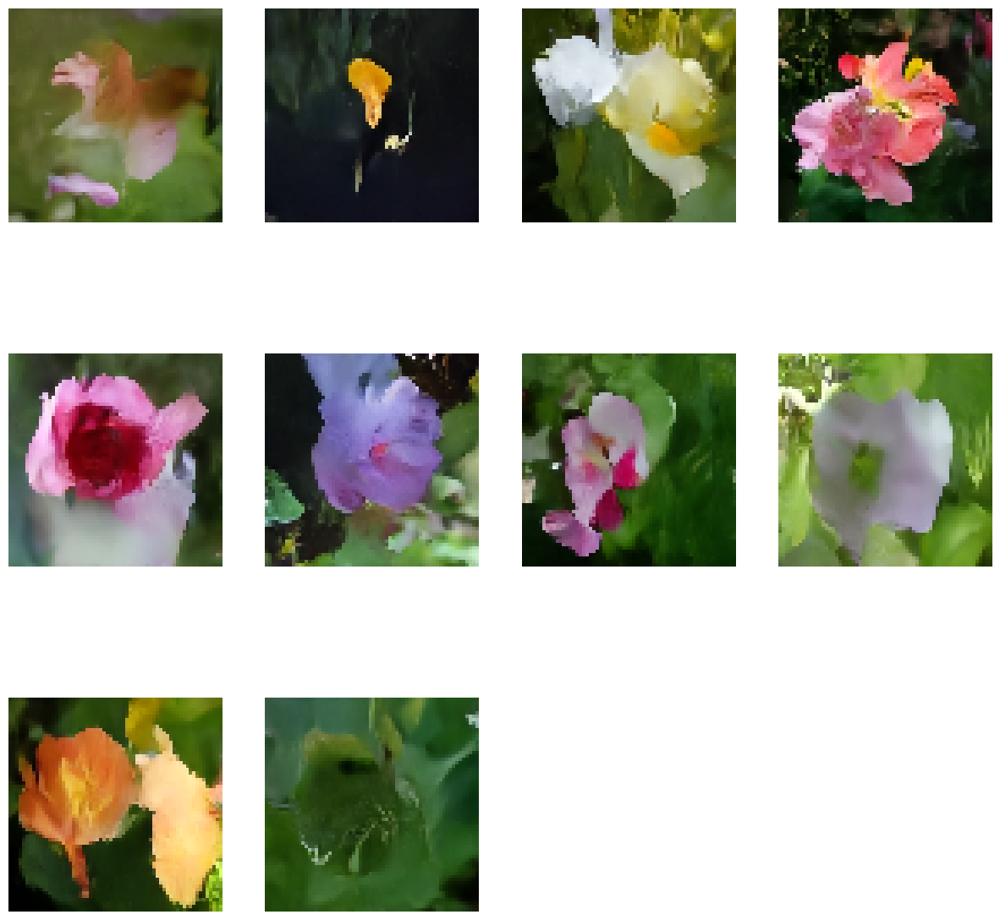

639/639 [==============================] - 128s 197ms/step - n_loss: 0.1734
Epoch 29/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1737

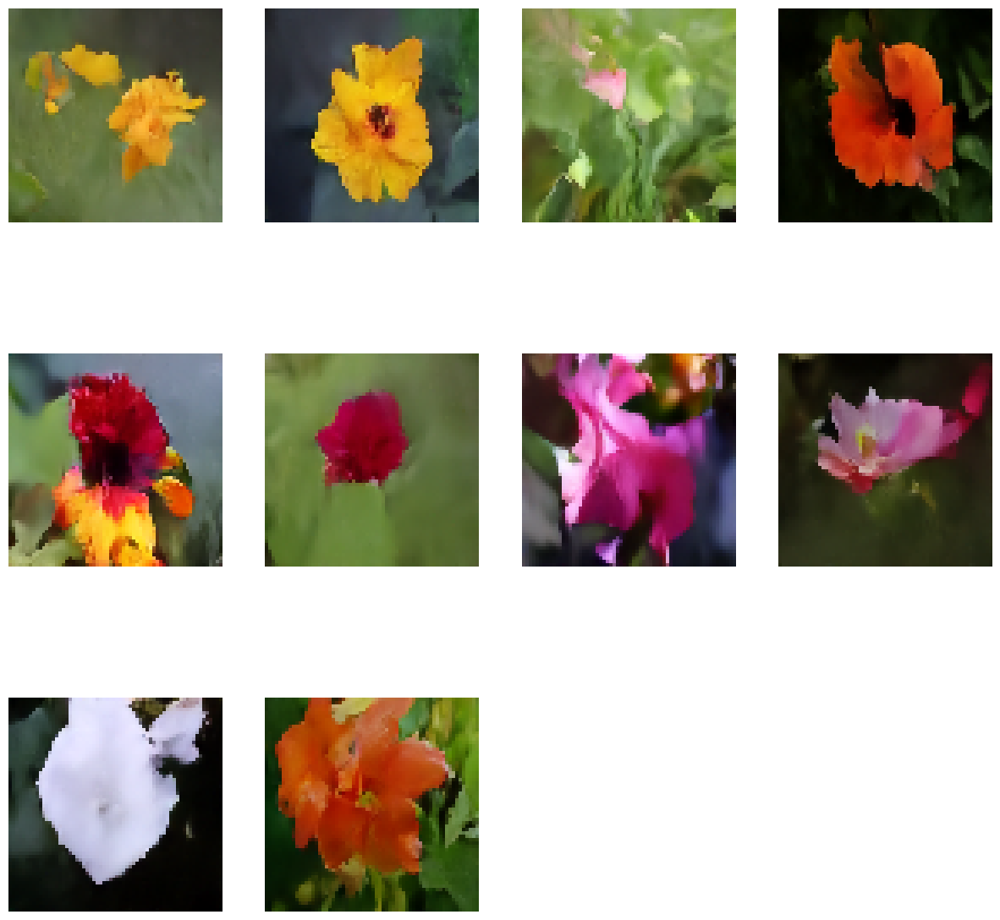

639/639 [==============================] - 127s 197ms/step - n_loss: 0.1737
Epoch 30/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1732

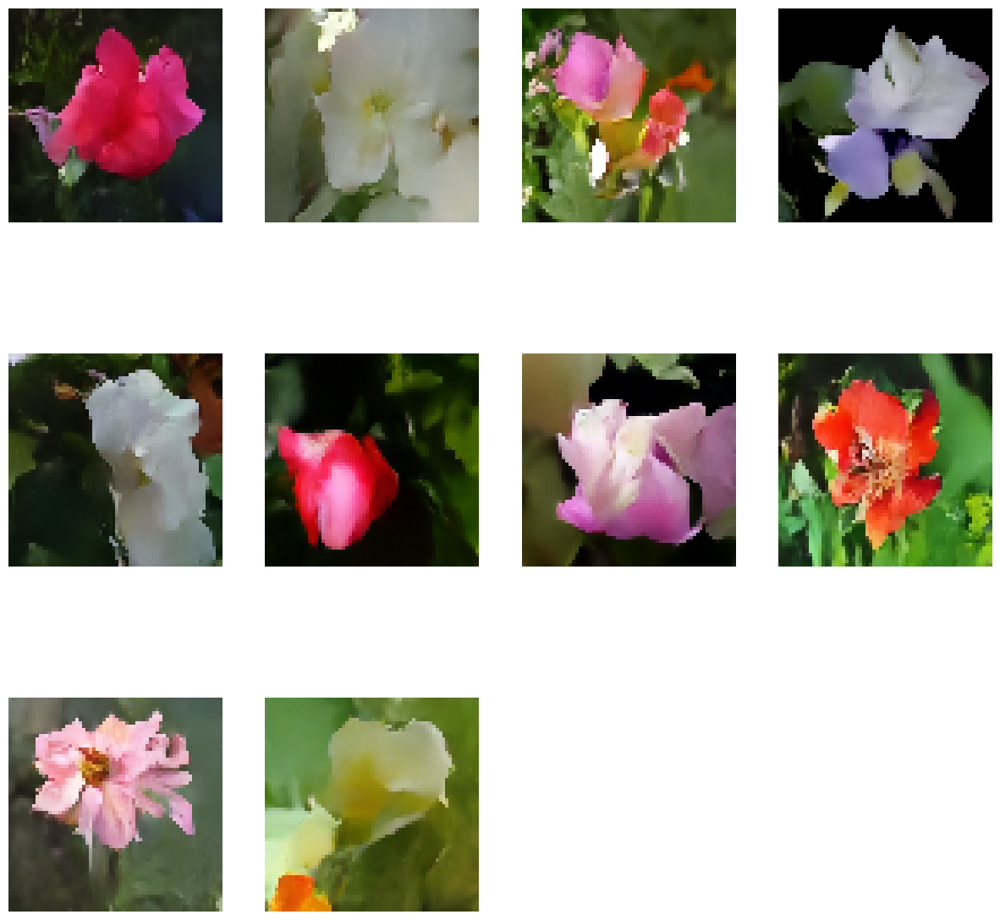

639/639 [==============================] - 127s 197ms/step - n_loss: 0.1732
Epoch 31/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1733

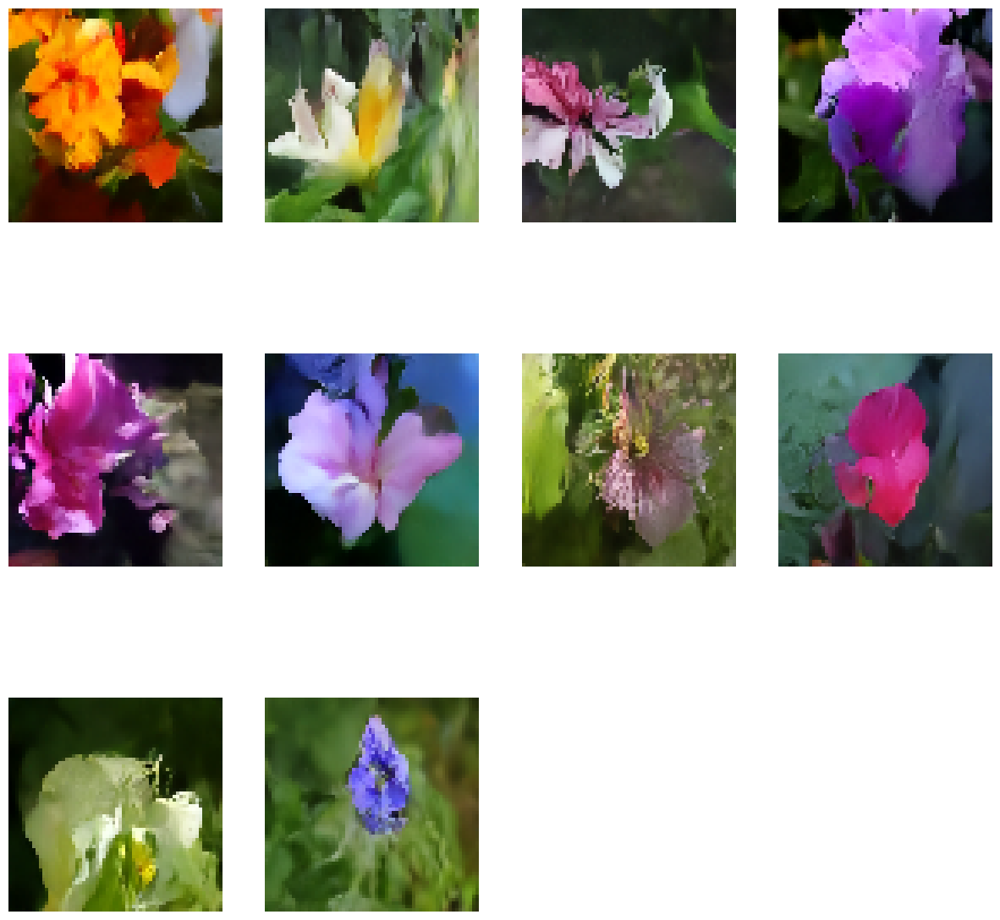

639/639 [==============================] - 128s 198ms/step - n_loss: 0.1733
Epoch 32/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1731

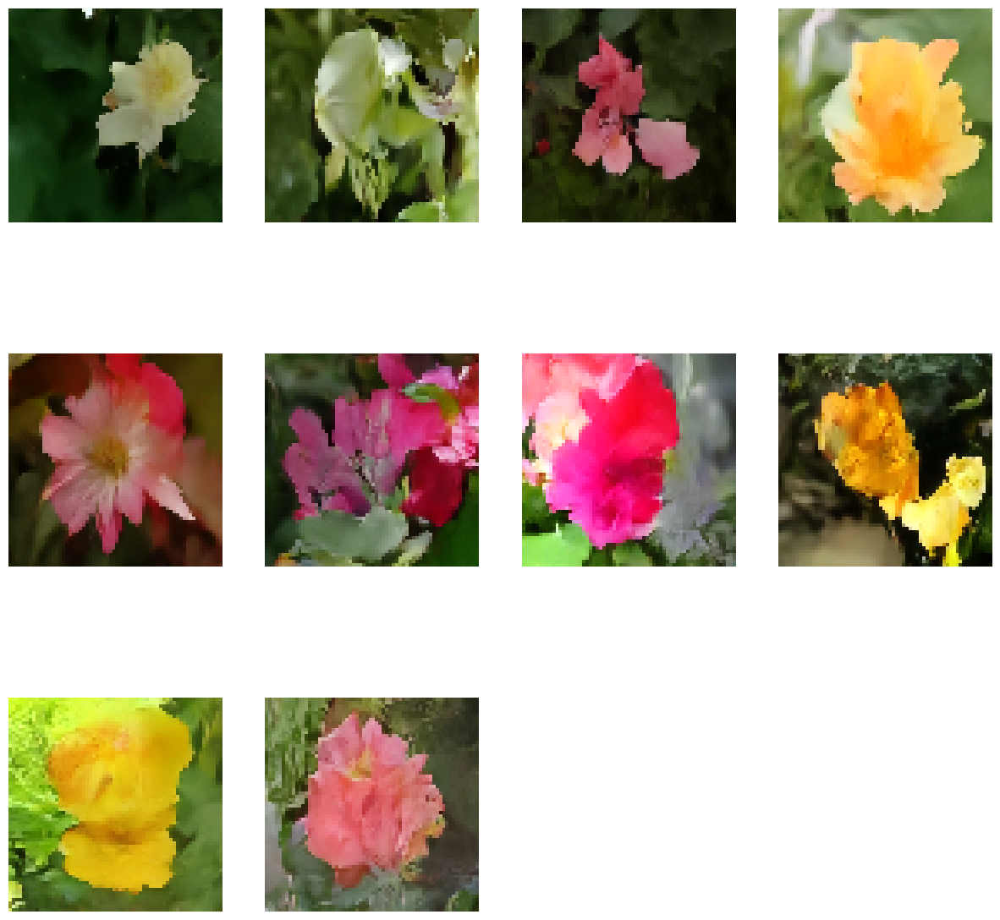

639/639 [==============================] - 128s 198ms/step - n_loss: 0.1731
Epoch 33/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1730

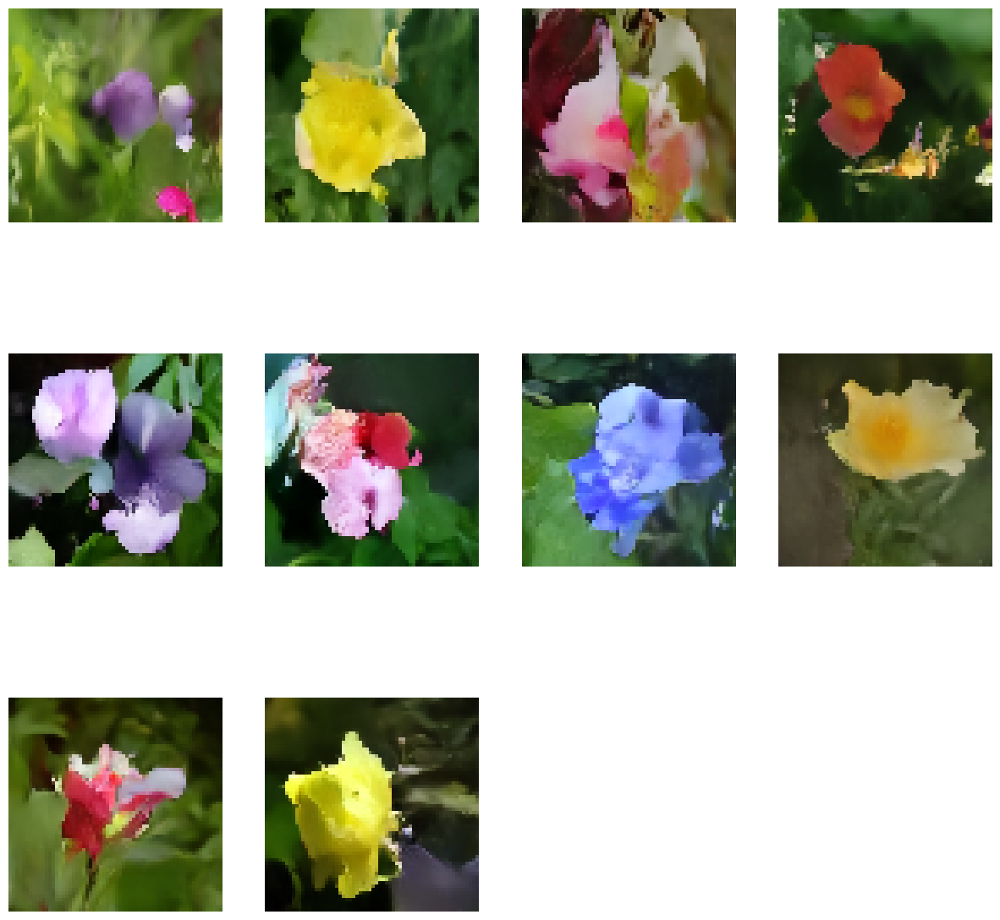

639/639 [==============================] - 128s 199ms/step - n_loss: 0.1730
Epoch 34/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1730

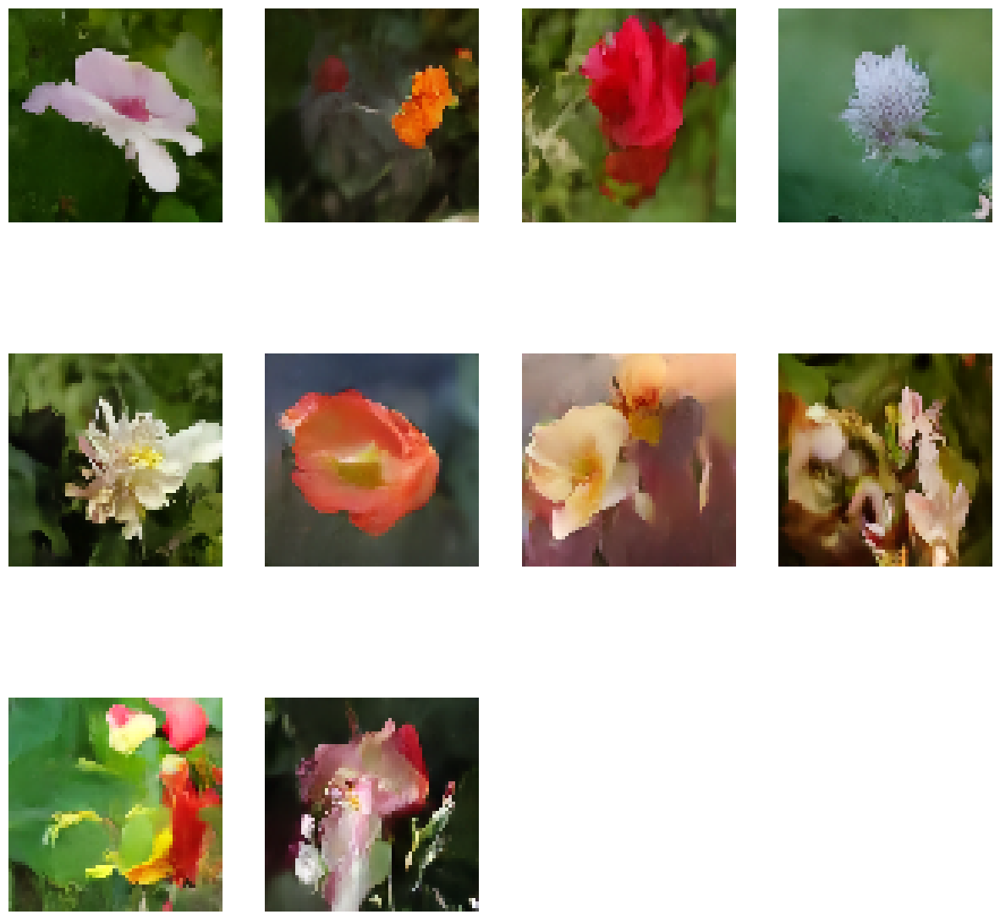

639/639 [==============================] - 128s 199ms/step - n_loss: 0.1730
Epoch 35/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1724

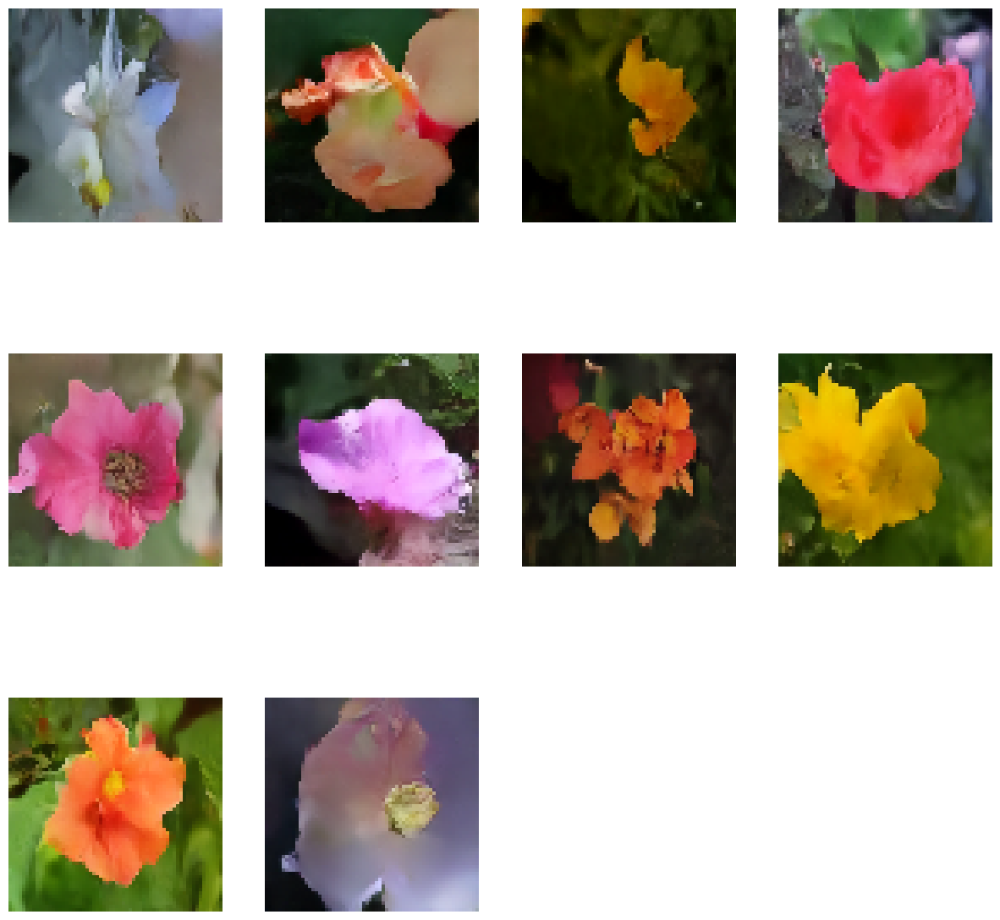

639/639 [==============================] - 129s 199ms/step - n_loss: 0.1724
Epoch 36/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1726

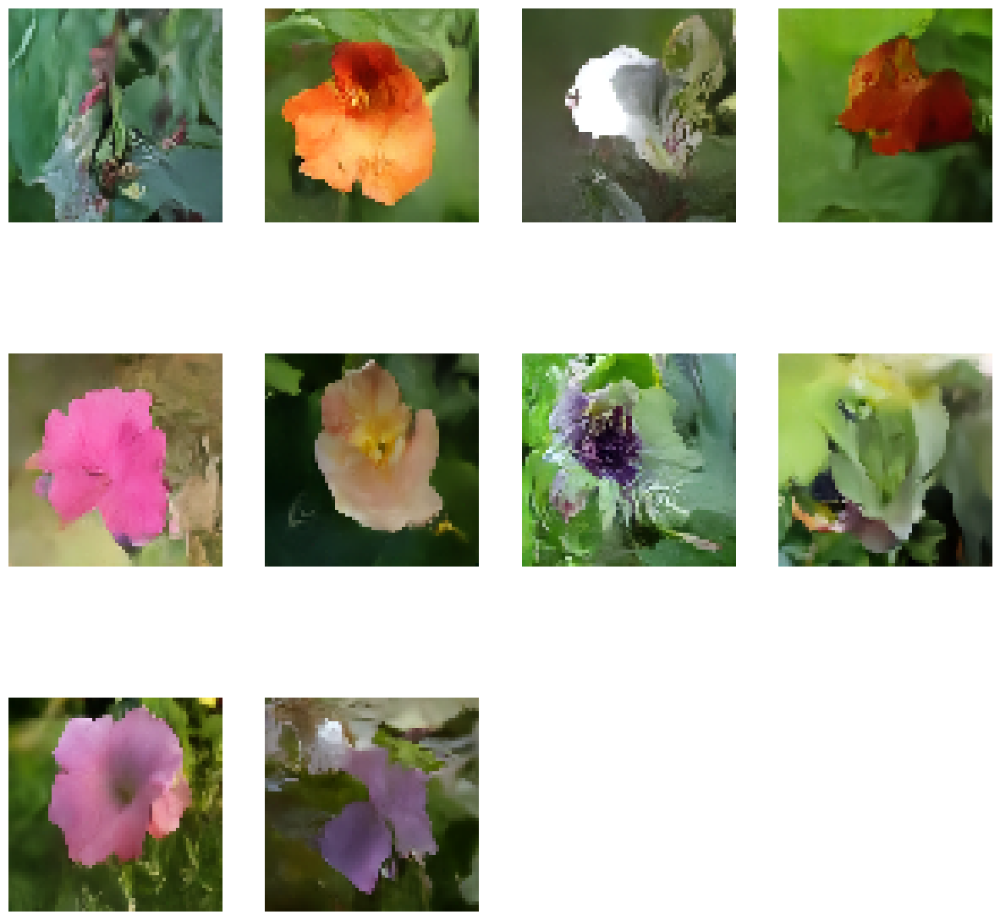

639/639 [==============================] - 127s 197ms/step - n_loss: 0.1726
Epoch 37/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1731

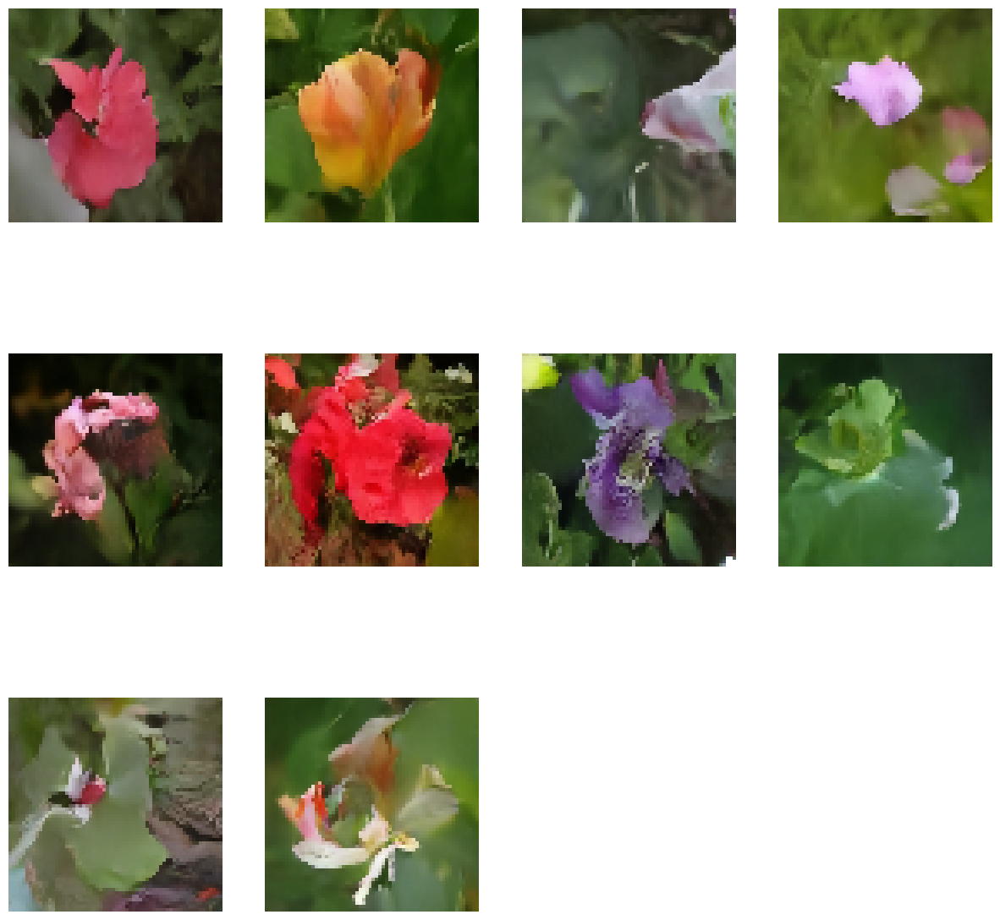

639/639 [==============================] - 128s 198ms/step - n_loss: 0.1731
Epoch 38/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1727

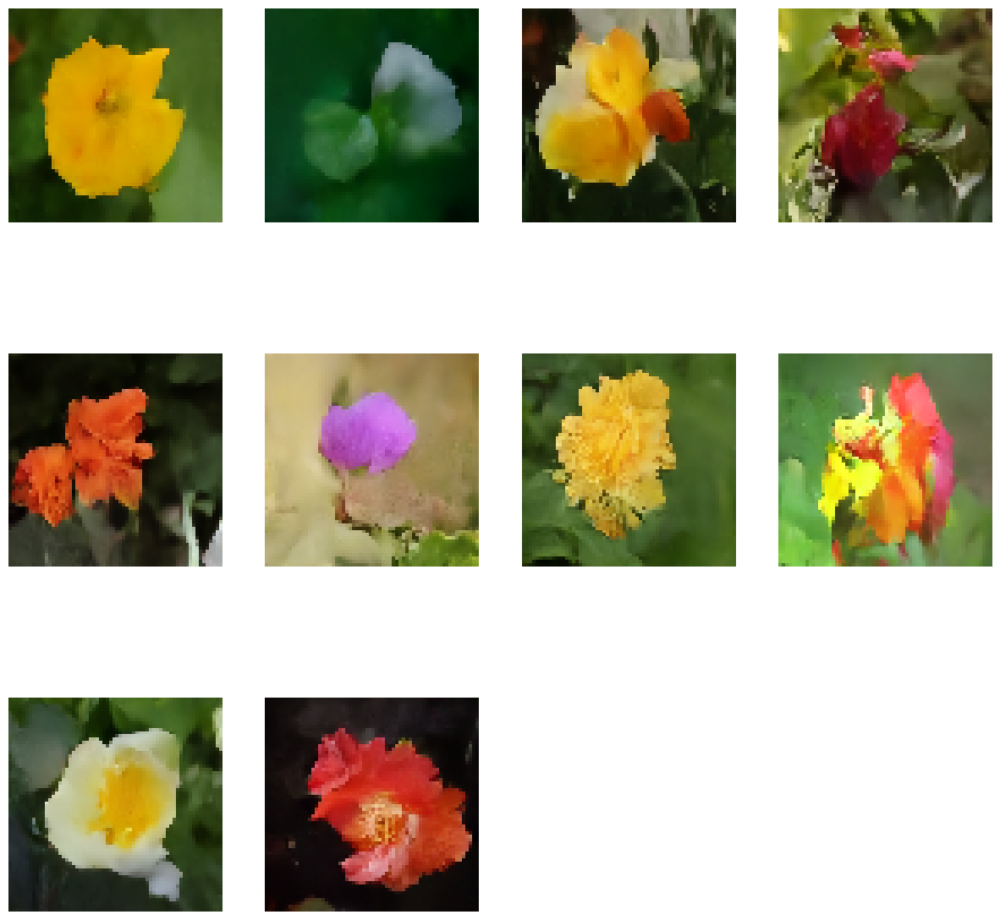

639/639 [==============================] - 128s 199ms/step - n_loss: 0.1727
Epoch 39/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1722

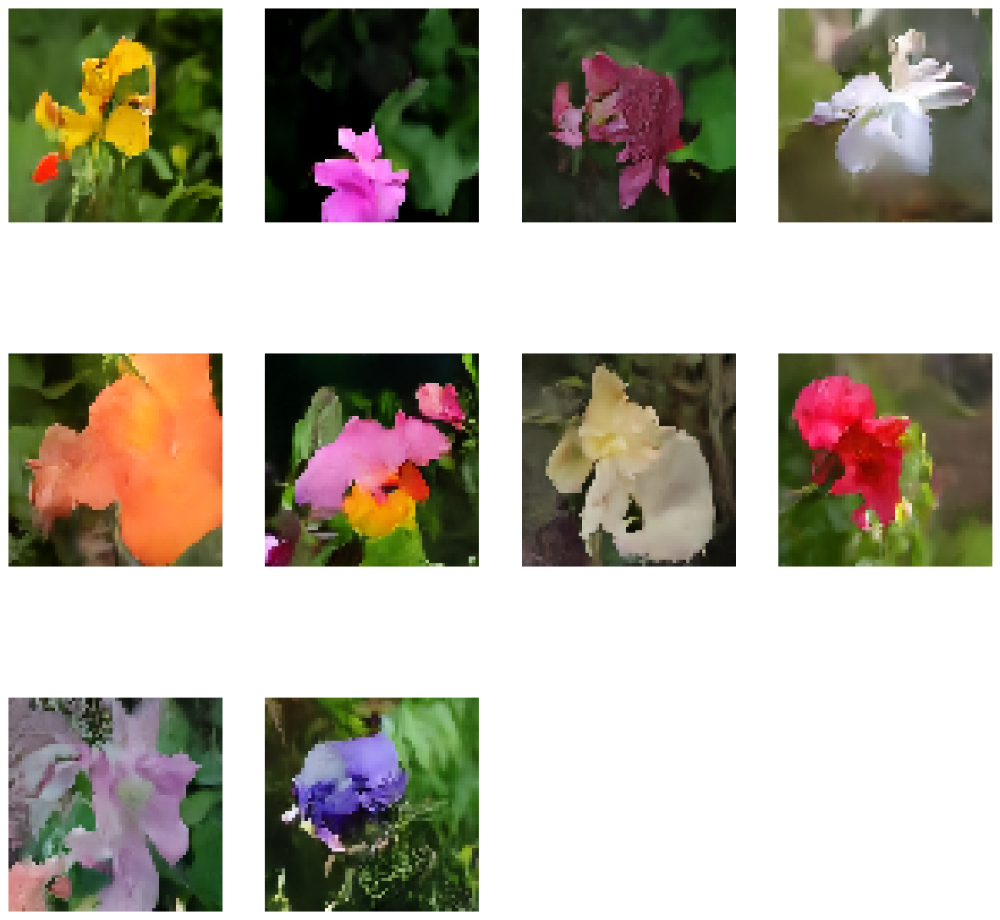

639/639 [==============================] - 127s 197ms/step - n_loss: 0.1722
Epoch 40/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1723

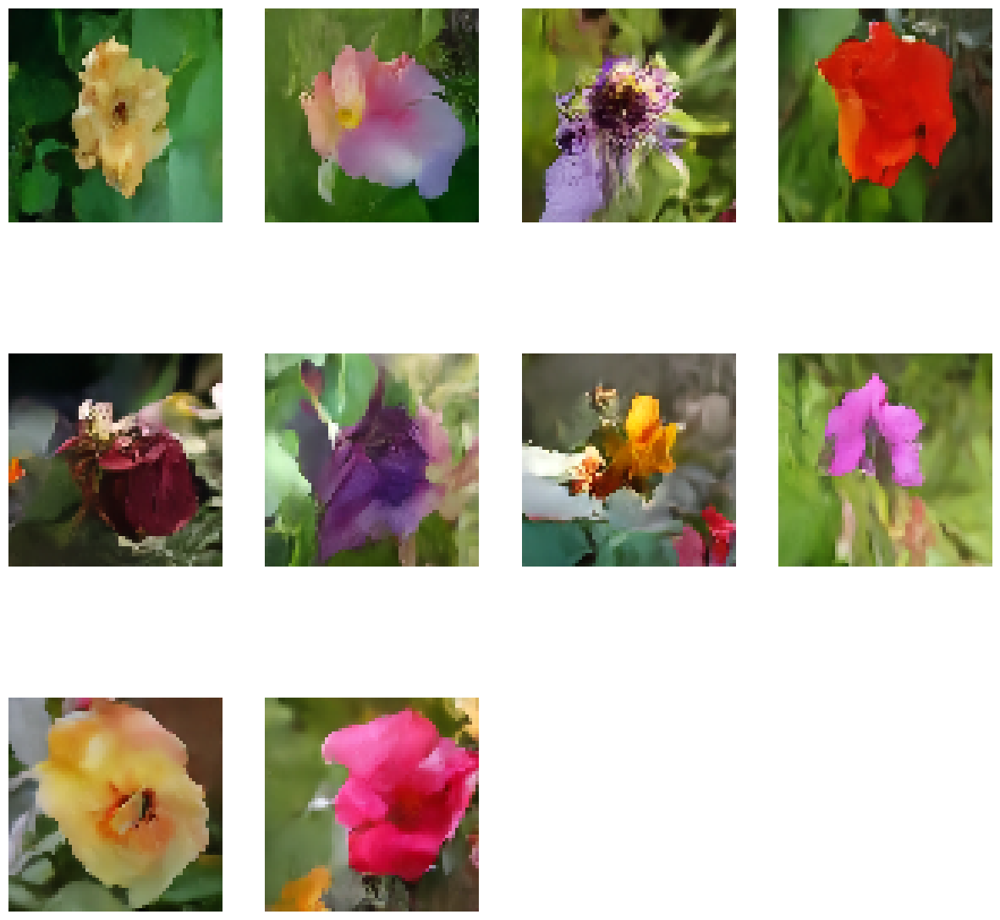

639/639 [==============================] - 129s 200ms/step - n_loss: 0.1723
Epoch 41/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1721

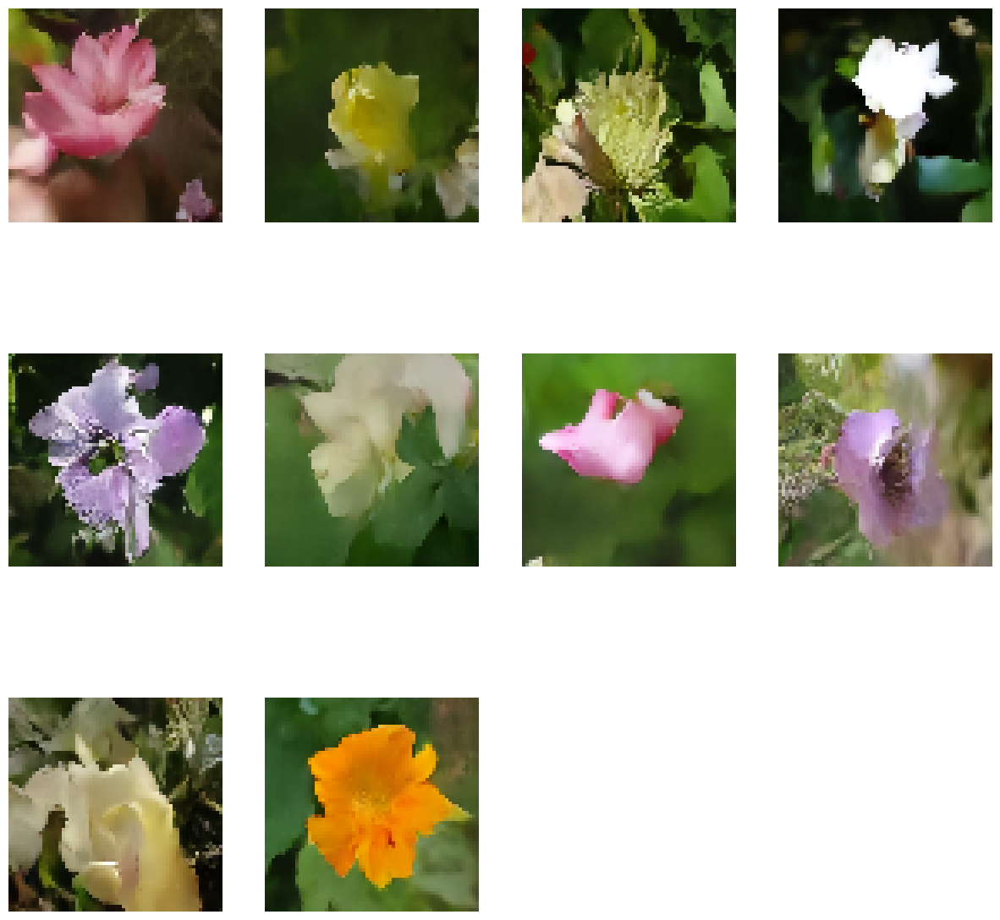

639/639 [==============================] - 127s 197ms/step - n_loss: 0.1721
Epoch 42/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1724

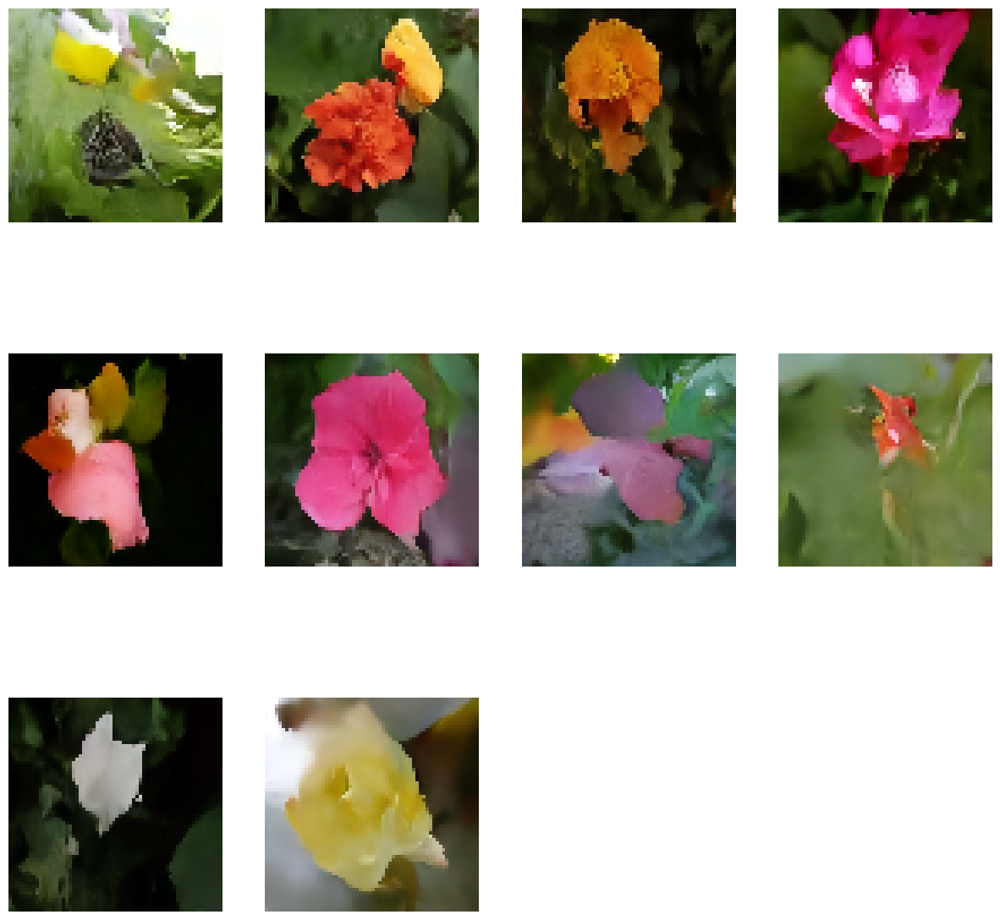

639/639 [==============================] - 130s 200ms/step - n_loss: 0.1724
Epoch 43/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1720

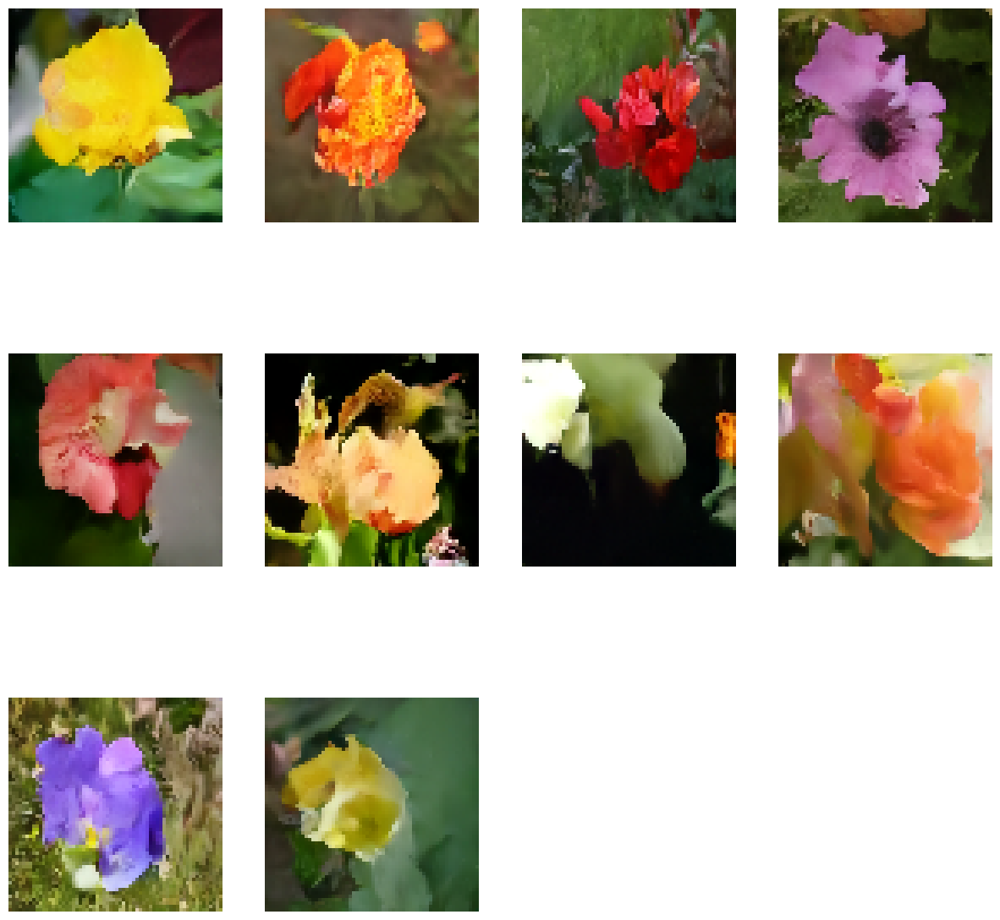

639/639 [==============================] - 128s 198ms/step - n_loss: 0.1720
Epoch 44/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1721

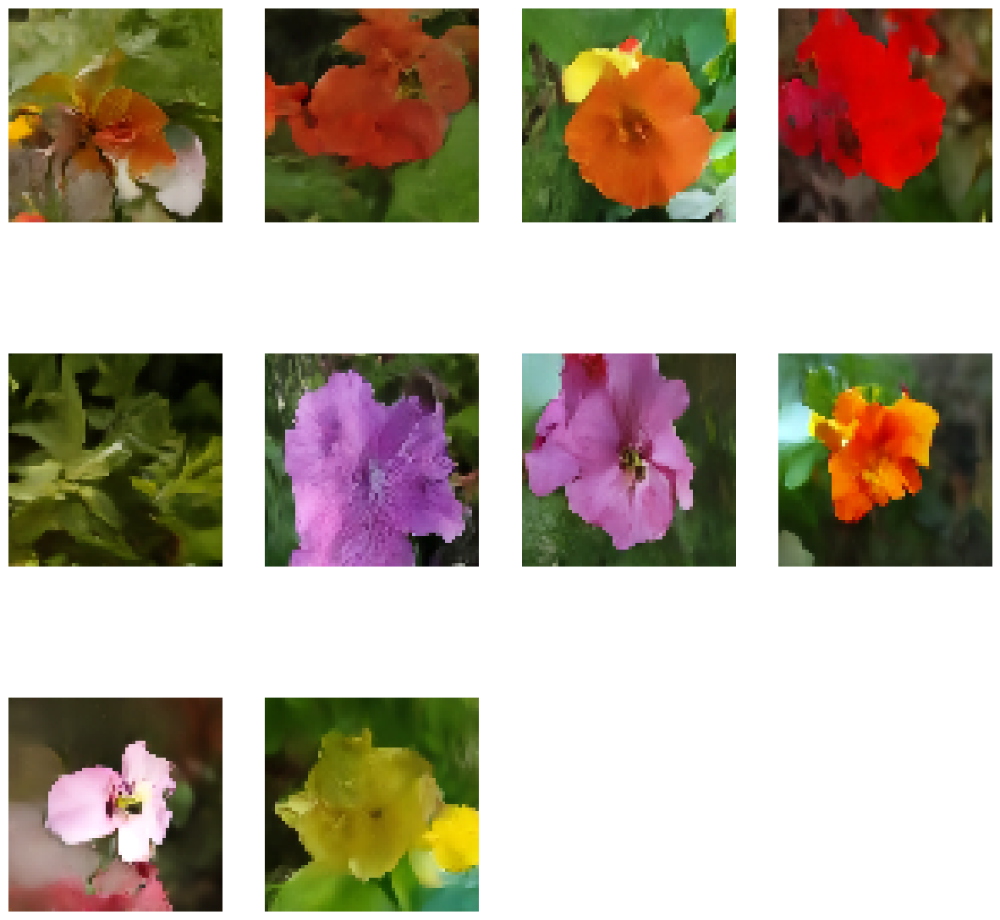

639/639 [==============================] - 129s 200ms/step - n_loss: 0.1721
Epoch 45/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1714

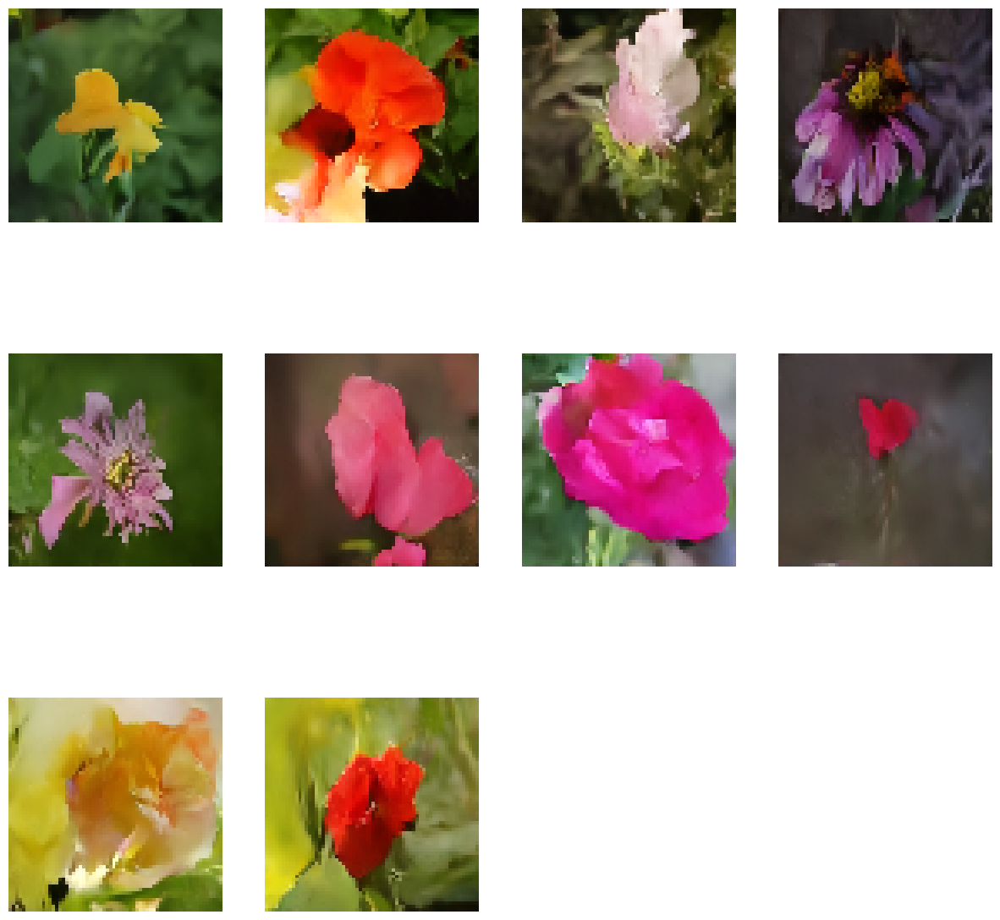

639/639 [==============================] - 128s 198ms/step - n_loss: 0.1714
Epoch 46/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1725

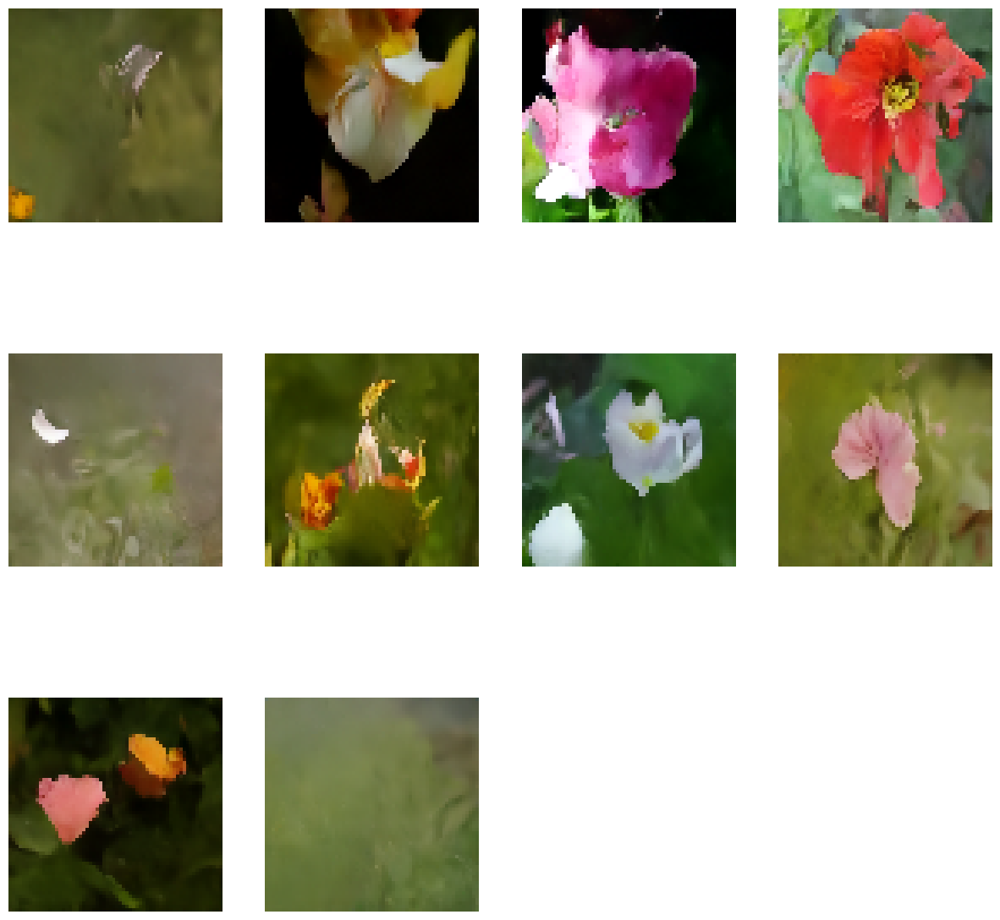

639/639 [==============================] - 129s 199ms/step - n_loss: 0.1725
Epoch 47/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1719

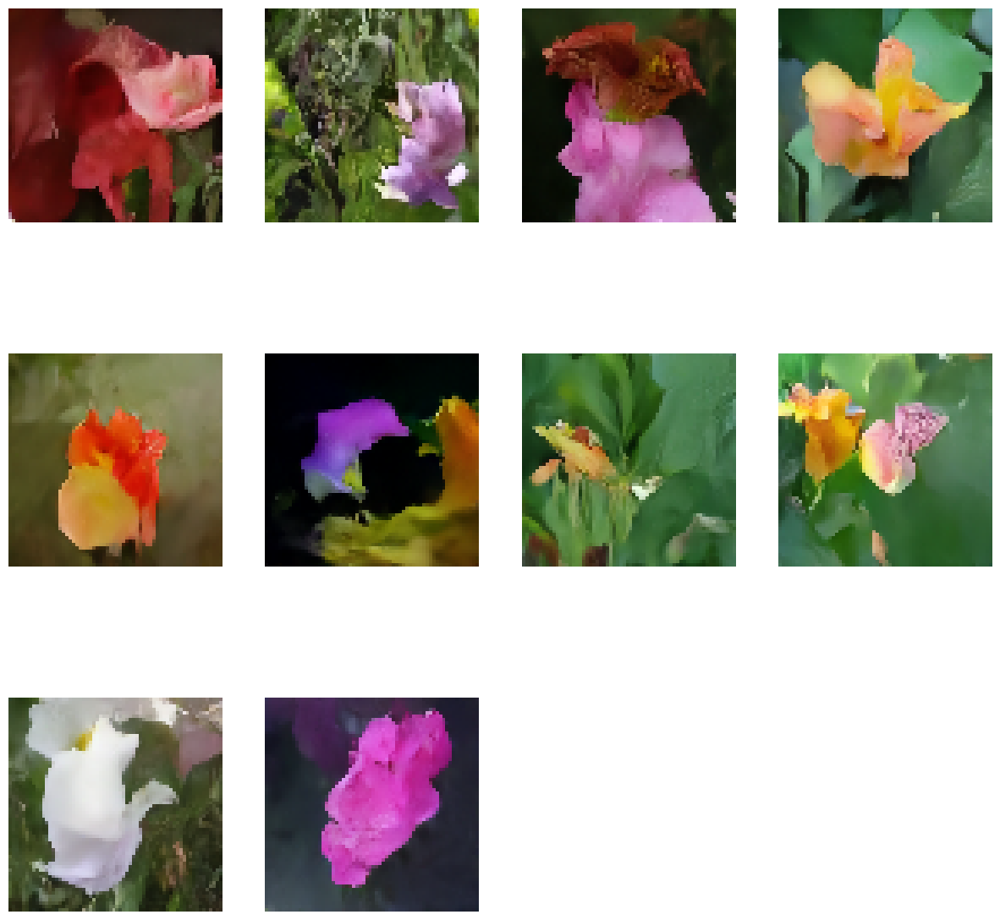

639/639 [==============================] - 128s 198ms/step - n_loss: 0.1719
Epoch 48/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1713

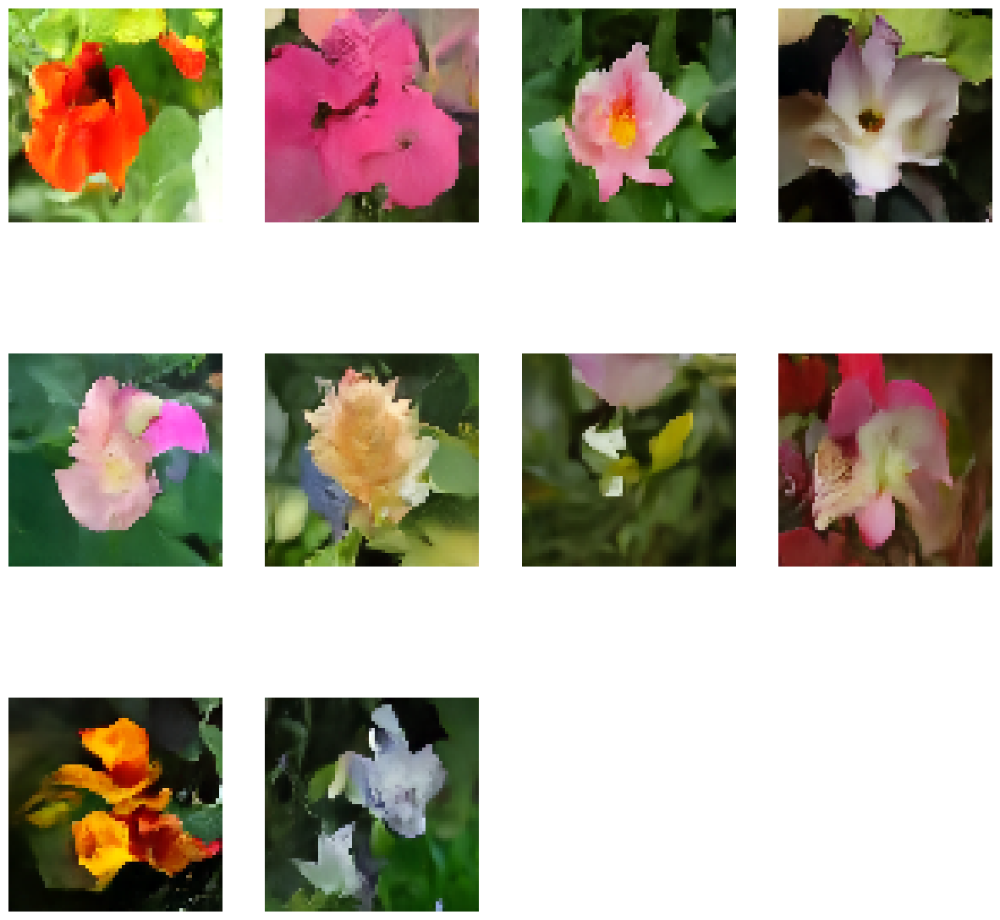

639/639 [==============================] - 129s 200ms/step - n_loss: 0.1713
Epoch 49/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1713

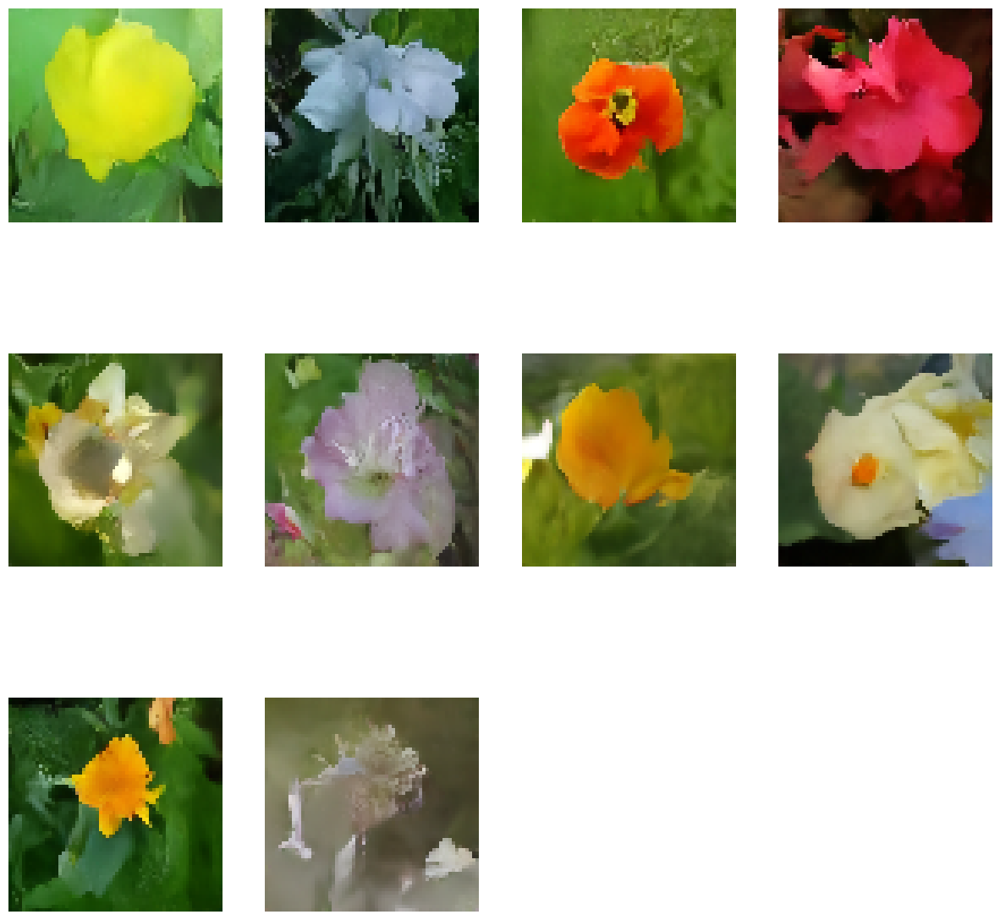

639/639 [==============================] - 129s 200ms/step - n_loss: 0.1713
Epoch 50/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1721

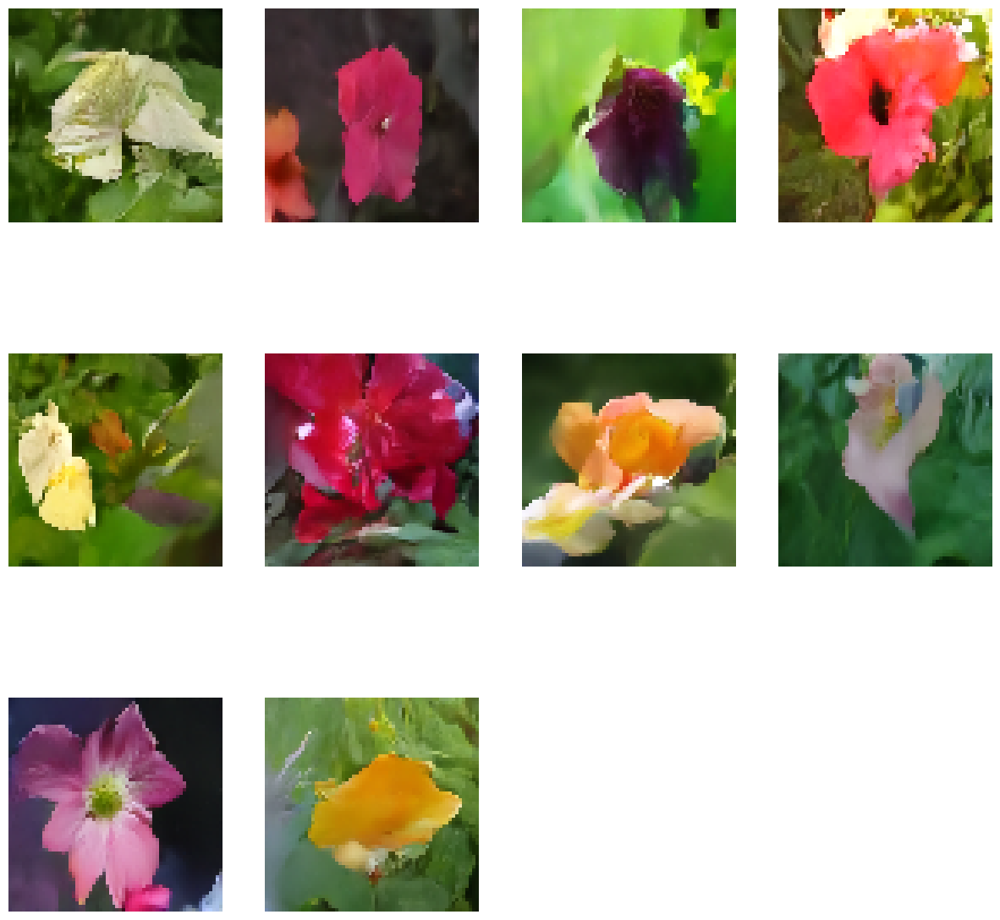

639/639 [==============================] - 130s 202ms/step - n_loss: 0.1721


In [ ]:
class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generate(
        num_images=self.num_img,
        diffusion_steps=PLOT_DIFFUSION_STEPS,
        ).numpy()

        # Create a grid of images
        num_cols = 4  # Change this value as needed
        num_rows = len(generated_images) // num_cols + 1
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

        # Display images
        for i, img in enumerate(generated_images):
            ax = axes[i // num_cols, i % num_cols]
            ax.imshow(img)
            ax.axis('off')

        # Remove any extra empty subplots
        for i in range(len(generated_images), num_rows * num_cols):
            axes[i // num_cols, i % num_cols].remove()

        plt.show()


image_generator_callback = ImageGenerator(num_img=10)

ddm.fit(
    train,
    epochs=EPOCHS,
    callbacks=[
        image_generator_callback,
    ],
)

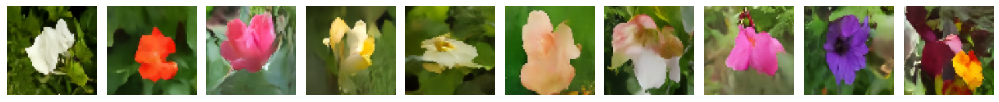

In [ ]:
# Generate some novel images of flowers
generated_images = ddm.generate(num_images=10, diffusion_steps=20).numpy()
num_images = len(generated_images)
fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

for i in range(num_images):
    axes[i].imshow(generated_images[i])
    axes[i].axis('off')

plt.tight_layout()
plt.show()


We can also test to see how adjusting the number of diffusion steps in the reverse
process affects image quality. Intuitively, the more steps taken by the process, the
higher the quality of the image generation.


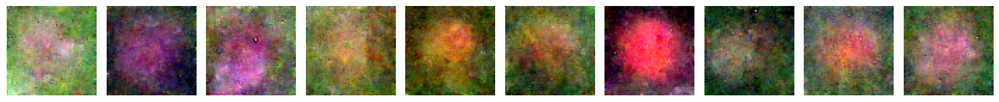

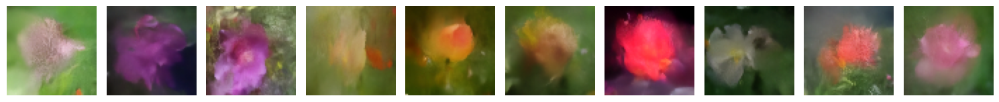

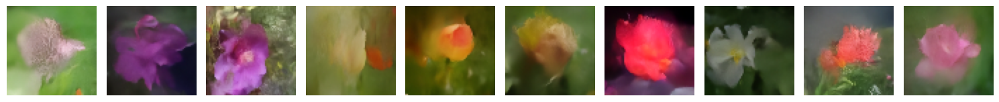

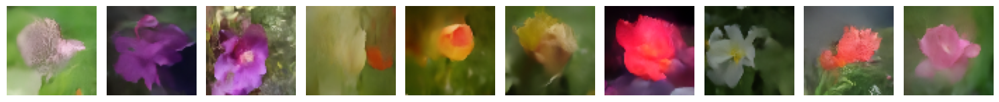

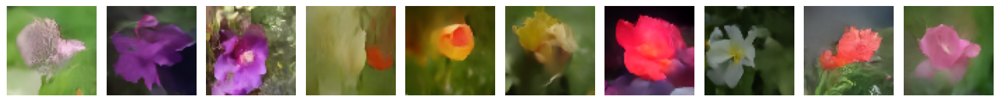

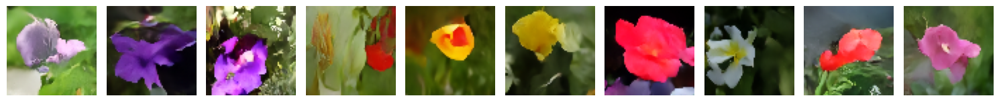

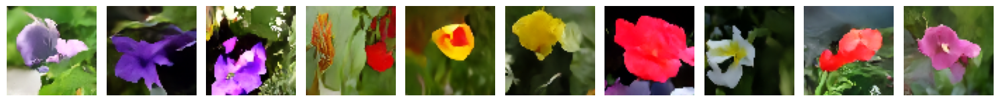

In [ ]:
# View improvement over greater number of diffusion steps
for diffusion_steps in list(np.arange(1, 6, 1)) + [20] + [100]:
    tf.random.set_seed(42)
    generated_images = ddm.generate(
        num_images=10,
        diffusion_steps=diffusion_steps,
    ).numpy()
    num_images = len(generated_images)
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

    for i in range(num_images):
        axes[i].imshow(generated_images[i])
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

Here we choose to use a form of spherical interpolation that
ensures that the variance remains constant while blending the two Gaussian noise
maps together.

Specifically, the initial noise map at each step is given by
a sin π/2
t + b cos π/2
t , where t ranges smoothly from 0 to 1 and a and bare the two
randomly sampled Gaussian noise tensors that we wish to interpolate between.


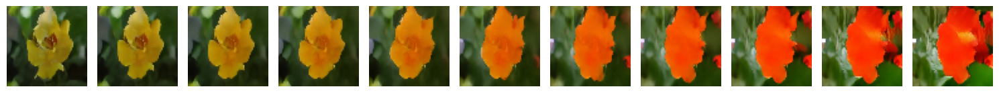

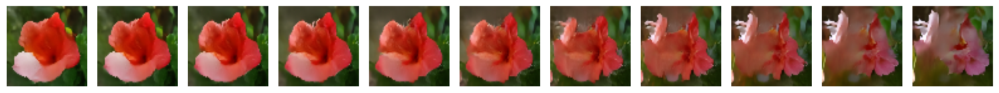

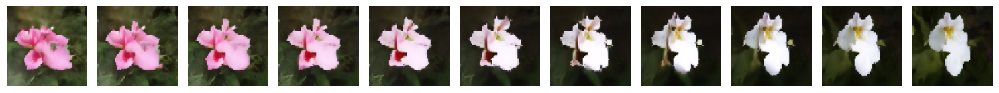

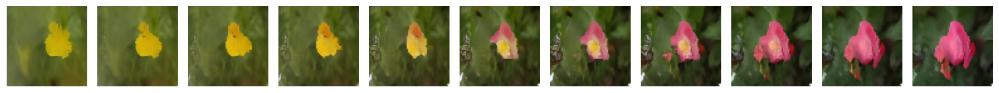

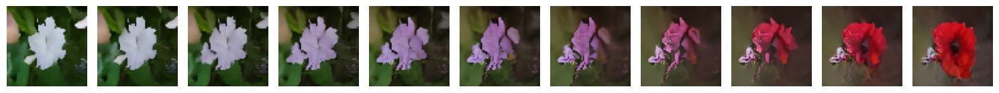

In [ ]:
# Interpolation between two points in the latent space
tf.random.set_seed(100)


def spherical_interpolation(a, b, t):
    return np.sin(t * math.pi / 2) * a + np.cos(t * math.pi / 2) * b


for i in range(5):
    a = tf.random.normal(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    b = tf.random.normal(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    initial_noise = np.array(
        [spherical_interpolation(a, b, t) for t in np.arange(0, 1.1, 0.1)]
    )
    generated_images = ddm.generate(
        num_images=2, diffusion_steps=20, initial_noise=initial_noise
    ).numpy()
    num_images = len(generated_images)
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

    for i in range(num_images):
        axes[i].imshow(generated_images[i])
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

We have seen how diffusion models are formed of a forward diffusion process and a
reverse diffusion process. The forward diffusion process adds noise to the training
data through a series of small steps, while the reverse diffusion process consists of a
model that tries to predict the noise added.

Sampling from the diffusion model is conducted over a series of steps. The U-Net is
used to predict the noise added to a given noised image, which is then used to calculate an estimate for the original image. The predicted noise is then reapplied
using a smaller noise rate. This process is repeated over a series of steps (which may
be significantly smaller than the number of steps used during training), starting from
a random point sampled from a standard Gaussian noise distribution, to obtain the
final generation.